In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

import torchvision.transforms as transforms
import torchvision.utils
from torchvision.utils import make_grid

import torchvision.datasets

import matplotlib.pyplot as plt 
plt.rcParams["figure.figsize"] = (10,6)

from tqdm import tqdm 

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


# Introduction to GANs

In this notebook you will build a GAN from scratch, grossly following the DCGAN architecture. 

**Goals:**


1.   Build a GAN arhictecture from scratch
2.   Write the GAN loss function and train GAN from scratch
3.   Have experience with some of the instability problems inherent with training GANs.
4.   [Bonus] Extend the unconditional GAN into a conditional GAN. 



## 1. Getting Started

We will work with the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset. It contains 60,000 images size 28x28 of handwritten digits, from 0 to 9.

## 1. Dataloading

### 1.1 Define some hyperparameters and transforms


In [ ]:
batch_size = 128 # Images per batch

# Resize to 32x32 for easier upsampling/downsampling
mytransform = transforms.Compose([transforms.Resize(32),
                                  transforms.ToTensor(),
                                 transforms.Normalize((.5), (.5))]) # normalize between [-1, 1] with tanh activation

mnist_train = torchvision.datasets.MNIST(root='.', download=True, transform=mytransform)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
dataloader = DataLoader(dataset=mnist_train, 
                         batch_size=batch_size,
                         shuffle=True)    

In [ ]:
# plot some images
real_batch, real_labels = next(iter(dataloader))

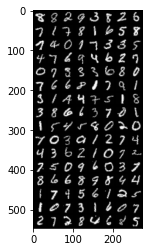

In [ ]:
plt.imshow(transforms.ToPILImage()(make_grid(real_batch)))

## 2. Model Architecture

We will follow the general architecture of a DCGAN - or deep convolutional GAN. This [influential paper](https://arxiv.org/pdf/1511.06434v2.pdf) produced much of the foundation for modern GANs and how to train them.

(GANs are notoriously **hard** to train, we will try to get a feeling why in this notebook.)


Complete the function `get_upscaling_block`. Then, use the function to define our model defined as follows:

Input: Random "noise" $z$ shaped `[n_batch, n_z]`

Output: Generated image size `[n_batch, 1, 32, 32]` in range [-1, 1]

1. Reshape z into `[n_batch, n_z, 1, 1]` to make it into an "image"
2. First upscaling block $\rightarrow$ `[n_batch, ngf*4, 4, 4]`
3. Second upscaling block $\rightarrow$ `[n_batch, ngf*2, 8, 8]`
4. Third upscaling block $\rightarrow$ `[n_batch, ngf, 16, 16]`
5. Fourth (and last) upscaling block $\rightarrow$ `[n_batch, 1, 32, 32]`

## 2.1. The Generator



The generator performs subsequent upsampling blocks, transforming a latent vector shaped [batch_size, latent_size] into an image (values in [-1, 1]).

The generator block will consists of:
- Transpose Convolution
- Batch Norm 
- ReLU

In [ ]:
def get_upscaling_block(channels_in, channels_out, kernel, stride, padding, last_layer=False):
    '''
    Each transpose conv will be followed by BatchNorm and ReLU,
    except the last block (which is only followed by tanh)
    '''
    if last_layer:
        block = nn.Sequential(nn.ConvTranspose2d(channels_in, channels_out, kernel_size=kernel, stride=stride, padding=padding, bias=False),
                               nn.BatchNorm2d(channels_out),
                               nn.ReLU())
        return block
    else:
        block = nn.Sequential(
            nn.ConvTranspose2d(channels_in, channels_out, kernel_size=kernel, stride=stride, padding=padding,
                               bias=False),
            nn.BatchNorm2d(channels_out),
            nn.Tanh())
        return block





class Generator(nn.Module):
    def __init__(self, nz, ngf, nchannels=1):
        '''
        nz: The latent size (100 in our case)
        ngf: The channel-size before the last layer (32 our case)
        '''
        super().__init__()
        self.model = nn.Sequential(get_upscaling_block(channels_in=nz, channels_out= ngf*4, kernel=4, stride=1, padding=0),
                                   get_upscaling_block(channels_in=ngf*4, channels_out= ngf*2, kernel=4, stride=2, padding=1),
                                   get_upscaling_block(channels_in=ngf*2, channels_out= ngf, kernel=4, stride=2, padding=1),
                                   get_upscaling_block(channels_in=ngf, channels_out= 1, kernel=4, stride=2, padding=1))

    def forward(self, z):
        x = z.unsqueeze(2).unsqueeze(2)  # give spatial dimensions to z
        return self.model(x)
        

### 2.1.3. Sanity Tests

In [ ]:
nz = 1000
z = torch.randn(batch_size, nz)

In [ ]:
G = Generator(nz=nz, ngf=16)
assert G(z).shape == (batch_size, 1, 32, 32)

G = Generator(nz=nz, ngf=16)
assert G(z).shape == (batch_size, 1, 32, 32)

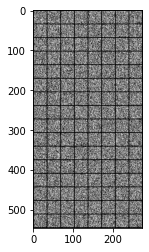

In [ ]:
# visualize the output - at first it should just look like random noise!!
x_fake = G(z)
plt.imshow(transforms.ToPILImage()(make_grid(x_fake, nrow=8)))

## 2.2. The discriminator

The discriminator will be a mirror image of the generator. 

The discriminator will also use a fully convolutional architecutre, with each block consisting of:
- Conv layer
- BatchNorm
- ReLU

Complete the function `get_downscaling_block` and then use it to define the following architecture for the discriminator:

Input: Image shaped `[n_batch, 1, 32, 32]` (in [-1, 1])
Output: Discriminator scores `[n_batch, 1]` in range [0, 1]

1. First downscaling block $\rightarrow$ `[n_batch, ndf, 16, 16]`
2. Second downscaling block $\rightarrow$ `[n_batch, ndf*2, 8, 8]`
3. Third downscaling block $\rightarrow$ `[n_batch, ndf*4, 4, 4]`
4. Last downscaling block $\rightarrow$ `[n_batch, 1]` 

In [ ]:
def get_downscaling_block(channels_in, channels_out, kernel, stride, padding, use_batch_norm=True, is_last=False):
    
    if is_last:
        # done
        block = nn.Sequential(nn.Conv2d(channels_in, channels_out, kernel_size=kernel, stride=stride, padding=padding, bias=False),
                nn.Sigmoid())
        return block
  
    elif not use_batch_norm:
        # done
        block = nn.Sequential(
            nn.Conv2d(channels_in, channels_out, kernel_size=kernel, stride=stride, padding=padding,
                               bias=False),
            nn.LeakyReLU(0.2))
        return block
    
    else:
        # done
        block = nn.Sequential(
            nn.Conv2d(channels_in, channels_out, kernel_size=kernel, stride=stride, padding=padding,
                               bias=False),
            nn.BatchNorm2d(channels_out),
            nn.LeakyReLU(0.2))
        return block
    
    


class Discriminator(nn.Module):
    def __init__(self, ndf, nchannels=1):
        super().__init__()
        
        
        self.model = nn.Sequential(
            get_downscaling_block(nchannels, ndf, 4, 2, 1),
            get_downscaling_block(ndf, ndf*2, 4, 2, 1),
            get_downscaling_block(ndf*2, ndf*4, 4, 2, 1),
            get_downscaling_block(ndf*4, 1, 4, 1, 0, is_last=True)
        )


    def forward(self, x):
        return self.model(x).squeeze(1).squeeze(1) # remove spatial dimensions

### 2.2.3 Sanity Checking

In [ ]:
real_batch, real_labels = next(iter(dataloader))

In [ ]:
D = Discriminator(ndf=32, nchannels=1)
assert D(real_batch).shape == (real_batch.shape[0], 1)

# 3. Training

## 3.1 Loss 
The essential thing to remember is that the logistic and the non-saturating logistic GAN losses can be written exclusively using the [binary cross entropy loss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html). Our GAN loss will be defined ONLY using the following criterion:



In [ ]:
criterion = nn.BCELoss() # we will build off of this to make our final GAN loss!

## 3.2 Helper functions

We will need a few helper functions. 
1. First, we need to continuously sample z from a Gaussian distribution. 
2. Secondly, we need to make our "ground-truth" labels when using the BCE loss. This should output vectors of either 0s or 1s. 

In [ ]:
def sample_z(batch_size, nz):
    return torch.randn(batch_size, nz, device=device)

# this is for the real ground-truth label
def get_labels_one(batch_size):
    r = torch.ones(batch_size, 1)
    return r.to(device)

# this is for the generated ground-truth label
def get_labels_zero(batch_size):
    r = torch.zeros(batch_size, 1) 
    return r.to(device)


# To initialize the weights of a GAN, the DCGAN paper found that best results are obtained
# with Gaussian initialization with mean=0; std=0.02
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
        

# for visualization
to_pil = transforms.ToPILImage()
renorm = transforms.Normalize((-1.), (2.))

## 3.3 Creating the optimizers and hyperparameters

The original DCGAN paper shows that Adam works well in the generator and the discriminator with a learning rate of 0.0002 and Beta1 = 0.5.

Define your optimizers

In [ ]:
nz = 100
ngf = 32
ndf = 32

nchannels= 1 
lr_d = 0.0002
lr_g = 0.0005
beta1= 0.5
display_freq = 200
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

netD = Discriminator(ndf, nchannels).to(device)
netG = Generator(nz, ngf).to(device)

netD.apply(weights_init)
netG.apply(weights_init)

g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))


cuda


## 3.3 Training!

Now for the fun part, training! 
Training a GAN consists in making an update to the discriminator, then the generator.
Training a GAN requires BABYSITTING!! Remember that many things can go wrong when training a GAN:
- The discriminator is too strong for the generator - the generator cannot improve. 
- The generator easily fools the discriminator - cannot learn.
- Mode collapse - generator is not capable of generating diverse images.

it: 0; g_loss: 3.1145823001861572; d_loss: 0.41824764013290405; avg_real_score: 0.9679623246192932; avg_fake_score: 0.05308019742369652: : 0it [00:00, ?it/s]

generated images


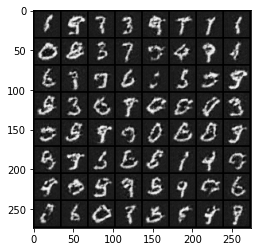

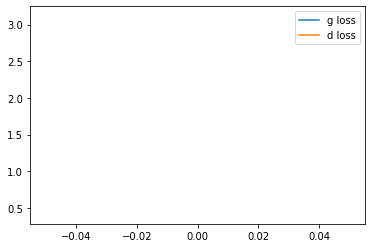

it: 200; g_loss: 3.271761655807495; d_loss: 0.12322522699832916; avg_real_score: 0.9306086301803589; avg_fake_score: 0.04829716309905052: : 199it [00:08, 26.56it/s] 

generated images


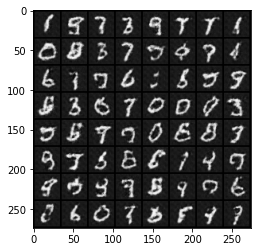

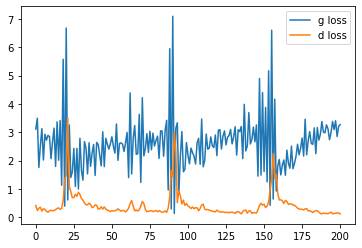

it: 400; g_loss: 3.3868138790130615; d_loss: 0.12796157598495483; avg_real_score: 0.913095235824585; avg_fake_score: 0.04469625651836395: : 400it [00:16, 25.01it/s] 

generated images


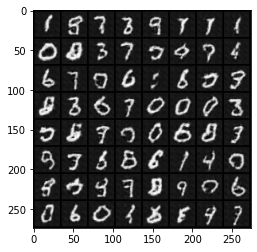

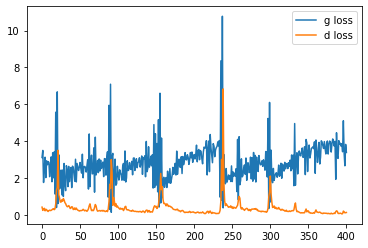

it: 468; g_loss: 2.742455244064331; d_loss: 0.36029163002967834; avg_real_score: 0.9191648960113525; avg_fake_score: 0.08007389307022095: : 469it [00:19, 24.47it/s]
it: 469; g_loss: 2.9432644844055176; d_loss: 0.27957069873809814; avg_real_score: 0.8806538581848145; avg_fake_score: 0.06724497675895691: : 0it [00:00, ?it/s]

generated images


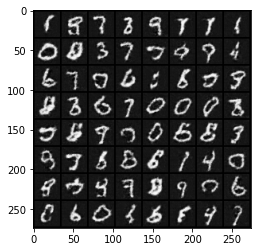

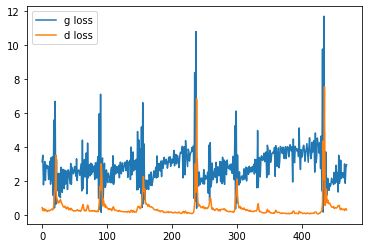

it: 669; g_loss: 3.7042129039764404; d_loss: 0.061315037310123444; avg_real_score: 0.9783769845962524; avg_fake_score: 0.033804796636104584: : 199it [00:08, 25.11it/s]

generated images


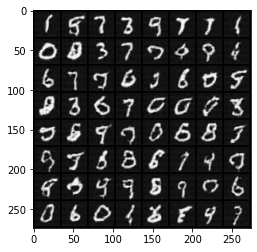

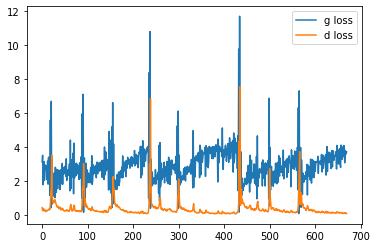

it: 869; g_loss: 5.196621894836426; d_loss: 0.5328783988952637; avg_real_score: 0.9800587892532349; avg_fake_score: 0.008529730141162872: : 400it [00:17, 24.08it/s]

generated images


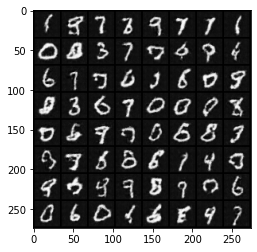

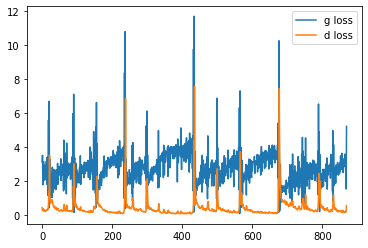

it: 937; g_loss: 1.2412651777267456; d_loss: 0.5954867005348206; avg_real_score: 0.6871749758720398; avg_fake_score: 0.34424889087677: : 469it [00:20, 23.25it/s]
it: 938; g_loss: 1.949878215789795; d_loss: 0.7443344593048096; avg_real_score: 0.8725311756134033; avg_fake_score: 0.17932316660881042: : 0it [00:00, ?it/s]

generated images


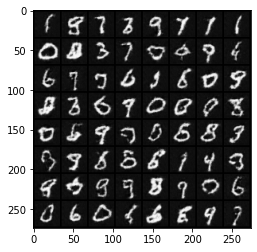

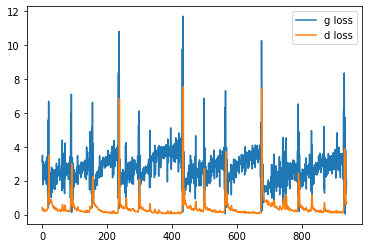

it: 1138; g_loss: 3.1109018325805664; d_loss: 0.1489771008491516; avg_real_score: 0.916820764541626; avg_fake_score: 0.05731699988245964: : 199it [00:08, 23.10it/s]  

generated images


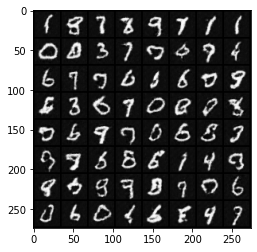

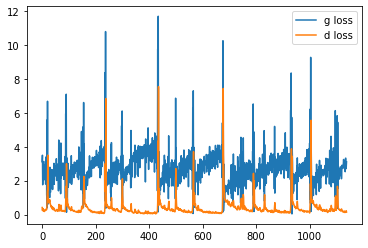

it: 1338; g_loss: 3.3845407962799072; d_loss: 0.2952541708946228; avg_real_score: 0.9255130290985107; avg_fake_score: 0.044438064098358154: : 400it [00:17, 24.02it/s]

generated images


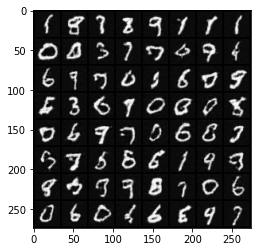

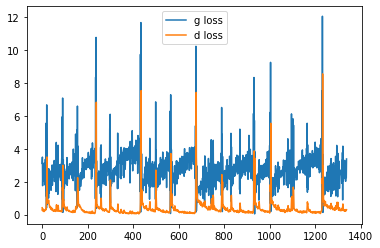

it: 1406; g_loss: 2.6117959022521973; d_loss: 0.4615488052368164; avg_real_score: 0.8876914978027344; avg_fake_score: 0.09900140762329102: : 469it [00:20, 22.38it/s]
it: 1407; g_loss: 2.6048104763031006; d_loss: 0.3081415891647339; avg_real_score: 0.8490523099899292; avg_fake_score: 0.08938515186309814: : 0it [00:00, ?it/s]

generated images


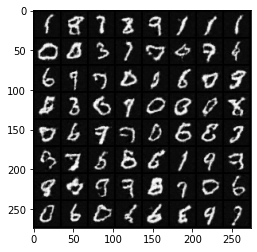

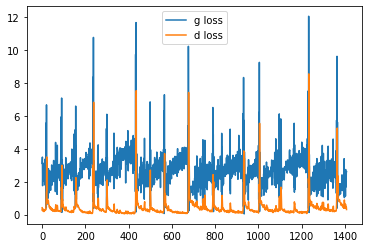

it: 1607; g_loss: 1.3985908031463623; d_loss: 0.5303995609283447; avg_real_score: 0.7320700287818909; avg_fake_score: 0.29212820529937744: : 199it [00:09, 23.31it/s]

generated images


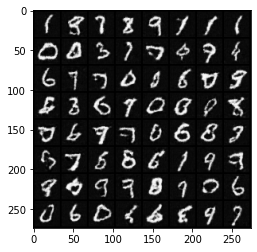

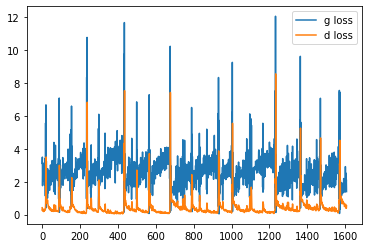

it: 1807; g_loss: 1.3349593877792358; d_loss: 0.4900575280189514; avg_real_score: 0.6896893382072449; avg_fake_score: 0.30876922607421875: : 400it [00:18, 22.94it/s]

generated images


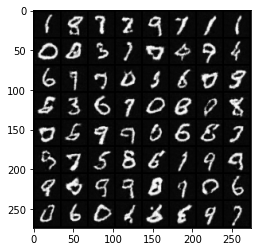

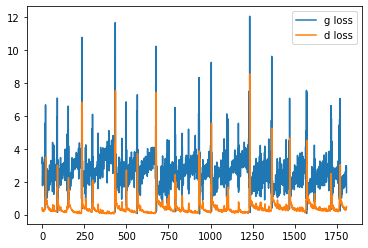

it: 1875; g_loss: 1.54947829246521; d_loss: 0.6970616579055786; avg_real_score: 0.6942097544670105; avg_fake_score: 0.2505567967891693: : 469it [00:21, 21.73it/s]
it: 1876; g_loss: 1.7711373567581177; d_loss: 0.6359593868255615; avg_real_score: 0.773903489112854; avg_fake_score: 0.20332971215248108: : 0it [00:00, ?it/s]

generated images


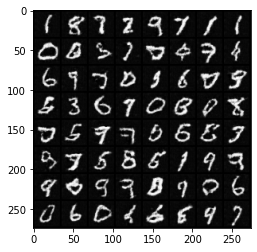

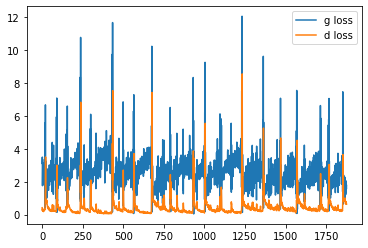

it: 2076; g_loss: 2.9454588890075684; d_loss: 0.3293229937553406; avg_real_score: 0.9182320833206177; avg_fake_score: 0.06628502905368805: : 198it [00:09, 22.13it/s]

generated images


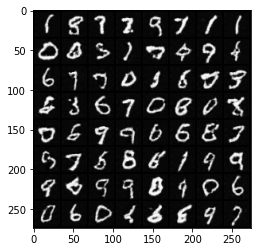

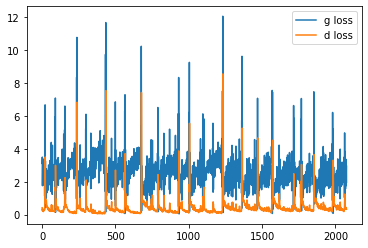

it: 2276; g_loss: 1.2573614120483398; d_loss: 0.8501975536346436; avg_real_score: 0.5278775691986084; avg_fake_score: 0.3326236605644226: : 399it [00:18, 22.77it/s] 

generated images


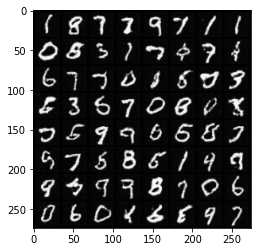

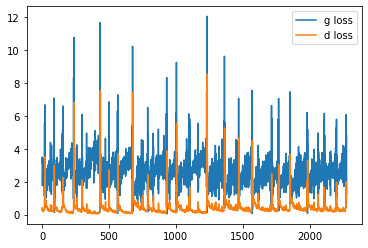

it: 2344; g_loss: 1.71701979637146; d_loss: 0.3087889850139618; avg_real_score: 0.7944784164428711; avg_fake_score: 0.21899573504924774: : 469it [00:21, 21.54it/s]
it: 2345; g_loss: 3.857125759124756; d_loss: 0.35782313346862793; avg_real_score: 0.9800278544425964; avg_fake_score: 0.028714926913380623: : 0it [00:00, ?it/s]

generated images


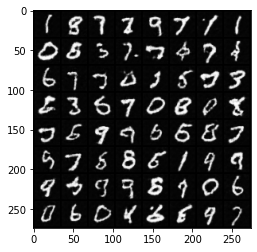

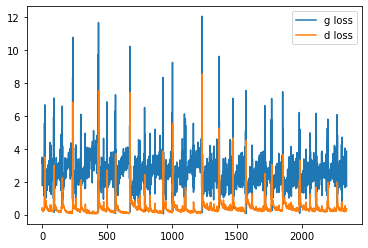

it: 2545; g_loss: 1.5948407649993896; d_loss: 0.8361383080482483; avg_real_score: 0.8145899772644043; avg_fake_score: 0.2297612726688385: : 199it [00:09, 22.75it/s] 

generated images


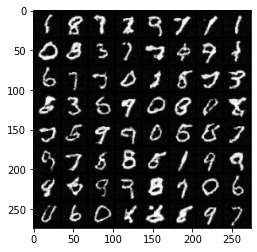

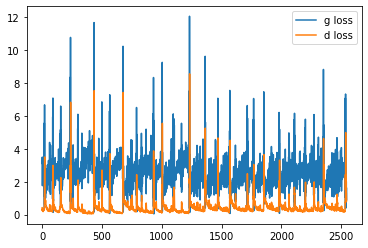

it: 2745; g_loss: 2.7202813625335693; d_loss: 0.3346465826034546; avg_real_score: 0.8179020881652832; avg_fake_score: 0.09321332722902298: : 400it [00:18, 22.23it/s]  

generated images


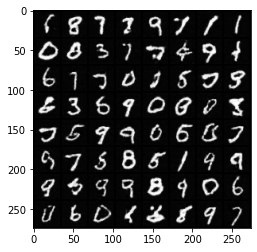

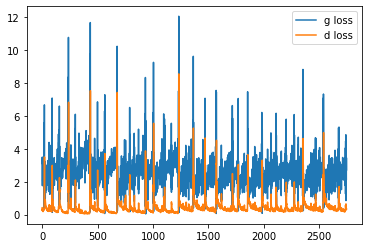

it: 2813; g_loss: 0.949985146522522; d_loss: 0.8743075728416443; avg_real_score: 0.5361899733543396; avg_fake_score: 0.4443152844905853: : 469it [00:22, 21.31it/s]
it: 2814; g_loss: 2.428044557571411; d_loss: 0.6132474541664124; avg_real_score: 0.9199986457824707; avg_fake_score: 0.11197143793106079: : 0it [00:00, ?it/s]

generated images


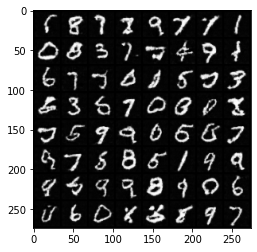

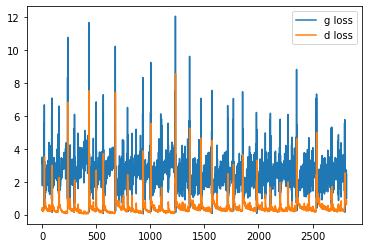

it: 3014; g_loss: 1.808032512664795; d_loss: 0.4563977122306824; avg_real_score: 0.9008655548095703; avg_fake_score: 0.20269009470939636: : 200it [00:09, 22.27it/s] 

generated images


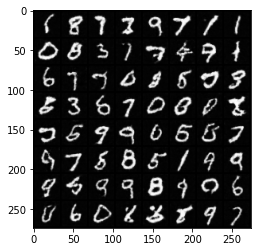

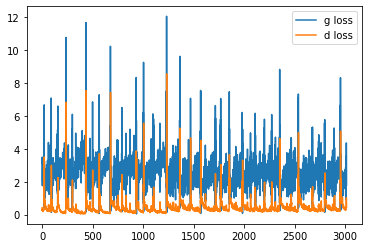

it: 3214; g_loss: 1.0687847137451172; d_loss: 1.296457052230835; avg_real_score: 0.3532935380935669; avg_fake_score: 0.3965314030647278: : 398it [00:19, 21.69it/s] 

generated images


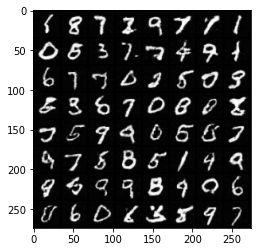

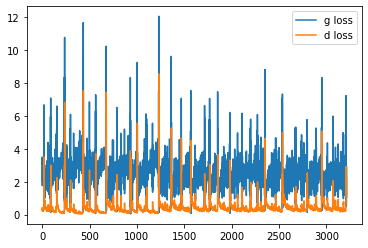

it: 3282; g_loss: 2.411228656768799; d_loss: 0.2799346148967743; avg_real_score: 0.8665462732315063; avg_fake_score: 0.11492832005023956: : 469it [00:22, 20.61it/s]
it: 3283; g_loss: 2.8456501960754395; d_loss: 0.26922523975372314; avg_real_score: 0.9084258675575256; avg_fake_score: 0.07955504208803177: : 0it [00:00, ?it/s]

generated images


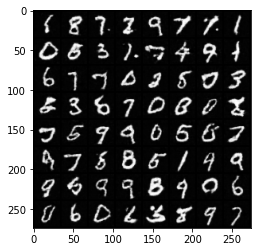

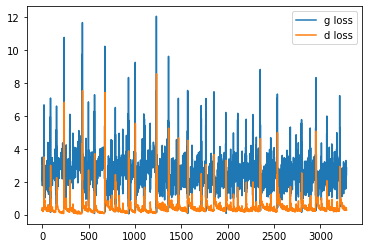

it: 3483; g_loss: 2.5551249980926514; d_loss: 0.30128738284111023; avg_real_score: 0.821113109588623; avg_fake_score: 0.11098694056272507: : 198it [00:09, 21.63it/s]

generated images


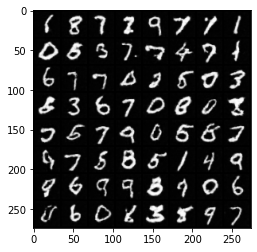

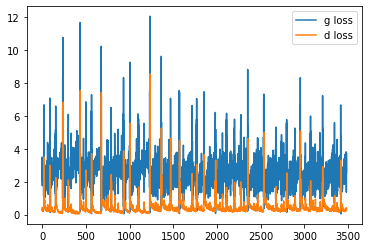

it: 3683; g_loss: 1.3392205238342285; d_loss: 0.6960567831993103; avg_real_score: 0.5895142555236816; avg_fake_score: 0.32407820224761963: : 399it [00:19, 21.67it/s]

generated images


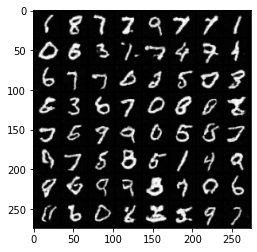

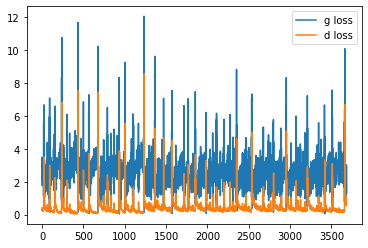

it: 3751; g_loss: 2.9865965843200684; d_loss: 0.22163374722003937; avg_real_score: 0.8967608213424683; avg_fake_score: 0.07368458062410355: : 469it [00:22, 20.61it/s]
it: 3752; g_loss: 3.117682933807373; d_loss: 0.1866091787815094; avg_real_score: 0.9245099425315857; avg_fake_score: 0.06381721049547195: : 0it [00:00, ?it/s]

generated images


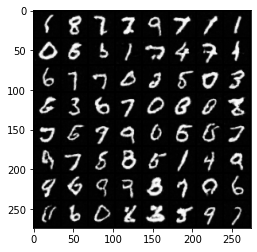

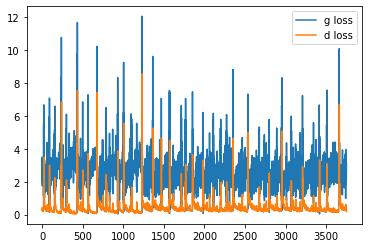

it: 3952; g_loss: 1.3572447299957275; d_loss: 1.0070923566818237; avg_real_score: 0.43934088945388794; avg_fake_score: 0.30871936678886414: : 199it [00:09, 22.08it/s]

generated images


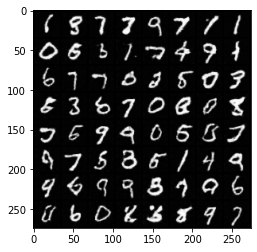

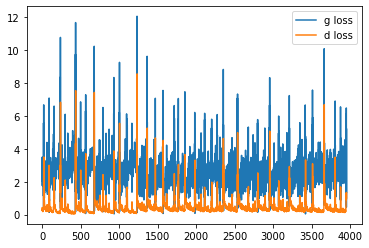

it: 4152; g_loss: 2.426893472671509; d_loss: 0.25765833258628845; avg_real_score: 0.8509758710861206; avg_fake_score: 0.11811920255422592: : 399it [00:19, 21.88it/s]

generated images


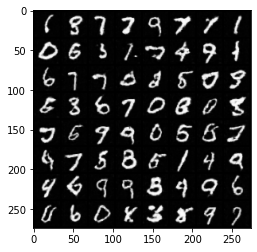

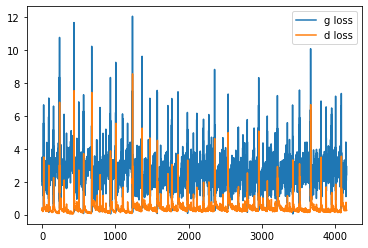

it: 4220; g_loss: 3.87605357170105; d_loss: 1.1211605072021484; avg_real_score: 0.9017121195793152; avg_fake_score: 0.03094111941754818: : 469it [00:23, 20.38it/s]
it: 4221; g_loss: 0.6712344884872437; d_loss: 1.8160250186920166; avg_real_score: 0.22918060421943665; avg_fake_score: 0.5644785165786743: : 0it [00:00, ?it/s]

generated images


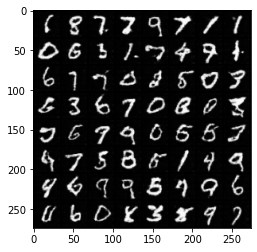

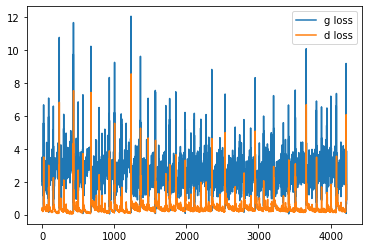

it: 4421; g_loss: 3.6291887760162354; d_loss: 0.16242973506450653; avg_real_score: 0.9801160097122192; avg_fake_score: 0.03706212341785431: : 200it [00:09, 21.32it/s]

generated images


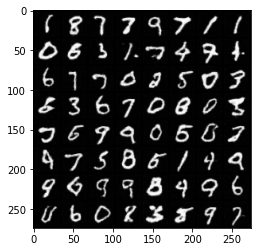

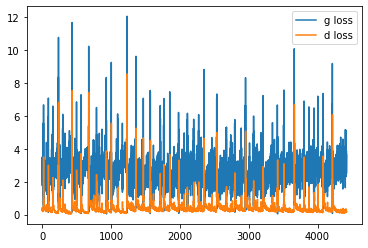

it: 4621; g_loss: 1.6757175922393799; d_loss: 0.5900776982307434; avg_real_score: 0.6975765228271484; avg_fake_score: 0.2434716373682022: : 398it [00:19, 20.96it/s]  

generated images


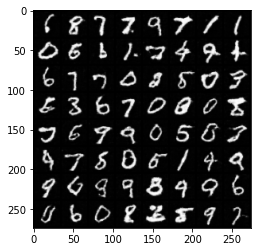

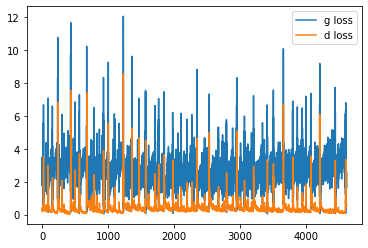

it: 4689; g_loss: 3.6978883743286133; d_loss: 0.08585063368082047; avg_real_score: 0.9612383842468262; avg_fake_score: 0.0346740186214447: : 469it [00:23, 20.14it/s]
it: 4690; g_loss: 2.774552345275879; d_loss: 0.1484358012676239; avg_real_score: 0.9167704582214355; avg_fake_score: 0.09016872942447662: : 0it [00:00, ?it/s]

generated images


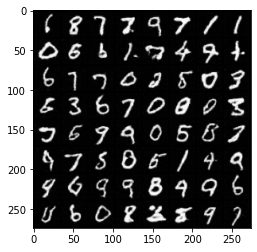

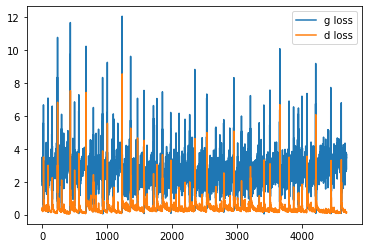

it: 4890; g_loss: 2.6889867782592773; d_loss: 0.1454969346523285; avg_real_score: 0.9006202220916748; avg_fake_score: 0.0989215150475502: : 199it [00:09, 22.38it/s]  

generated images


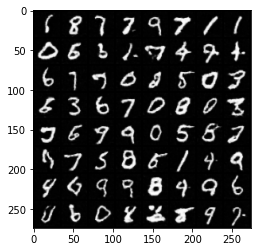

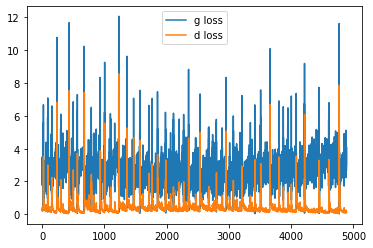

it: 5090; g_loss: 3.7689528465270996; d_loss: 0.09963957220315933; avg_real_score: 0.9781621694564819; avg_fake_score: 0.03348871320486069: : 400it [00:19, 21.85it/s]

generated images


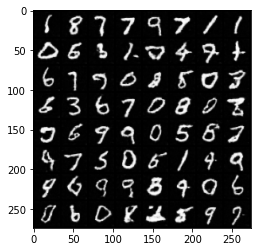

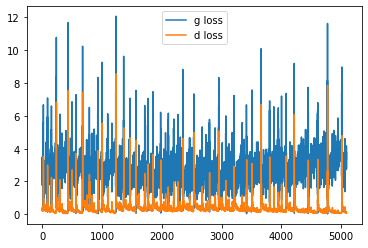

it: 5158; g_loss: 3.104262113571167; d_loss: 0.11823482066392899; avg_real_score: 0.9368504285812378; avg_fake_score: 0.06631742417812347: : 469it [00:23, 20.27it/s]
it: 5159; g_loss: 4.403336048126221; d_loss: 0.10674551129341125; avg_real_score: 0.9737027883529663; avg_fake_score: 0.02010497823357582: : 0it [00:00, ?it/s]

generated images


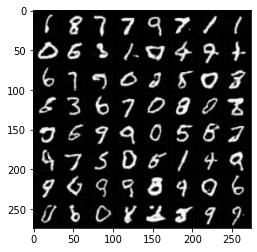

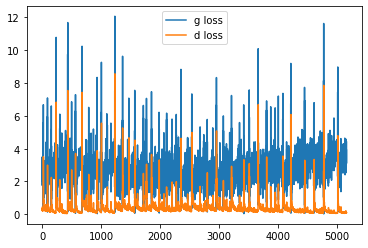

it: 5359; g_loss: 3.501936435699463; d_loss: 0.10279232263565063; avg_real_score: 0.9363176226615906; avg_fake_score: 0.04512574523687363: : 200it [00:09, 22.12it/s]  

generated images


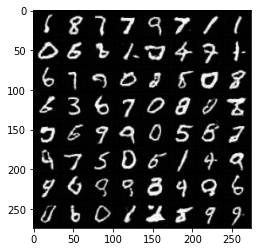

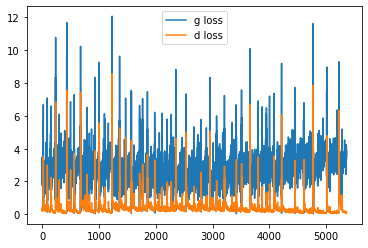

it: 5559; g_loss: 2.9588136672973633; d_loss: 0.24057920277118683; avg_real_score: 0.8866323828697205; avg_fake_score: 0.07675883919000626: : 398it [00:19, 21.48it/s]

generated images


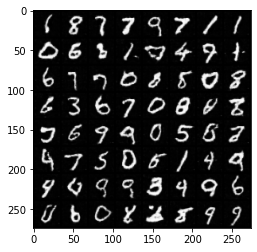

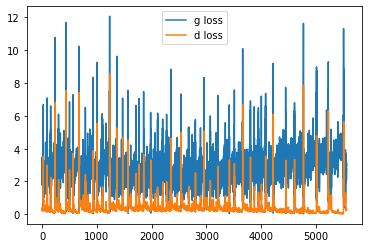

it: 5627; g_loss: 3.164072036743164; d_loss: 0.207760751247406; avg_real_score: 0.9074561595916748; avg_fake_score: 0.06121743842959404: : 469it [00:23, 20.38it/s]
it: 5628; g_loss: 2.7262675762176514; d_loss: 0.18589922785758972; avg_real_score: 0.8845243453979492; avg_fake_score: 0.09250061959028244: : 0it [00:00, ?it/s]

generated images


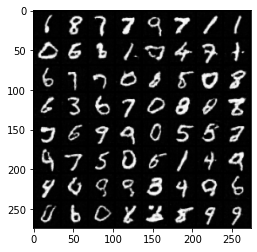

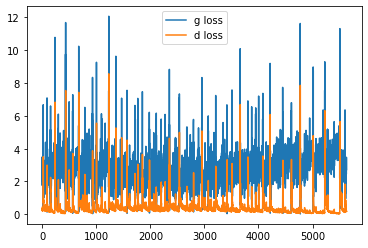

it: 5828; g_loss: 3.7447409629821777; d_loss: 0.06794673949480057; avg_real_score: 0.950536847114563; avg_fake_score: 0.036015890538692474: : 200it [00:09, 22.17it/s]

generated images


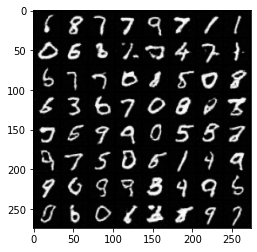

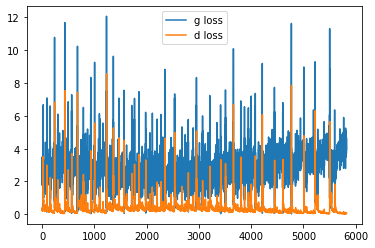

it: 6028; g_loss: 4.480319023132324; d_loss: 0.042073167860507965; avg_real_score: 0.9839909076690674; avg_fake_score: 0.017161542549729347: : 398it [00:19, 22.41it/s]

generated images


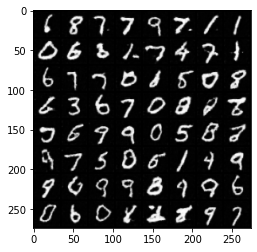

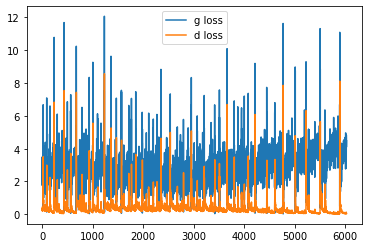

it: 6096; g_loss: 4.976457595825195; d_loss: 0.04605627804994583; avg_real_score: 0.9953808188438416; avg_fake_score: 0.011064308695495129: : 469it [00:23, 20.37it/s]
it: 6097; g_loss: 4.916248798370361; d_loss: 0.04604550451040268; avg_real_score: 0.9719794988632202; avg_fake_score: 0.013863452710211277: : 0it [00:00, ?it/s]

generated images


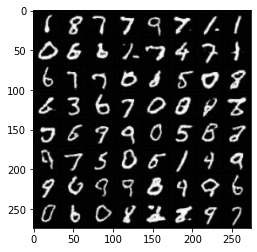

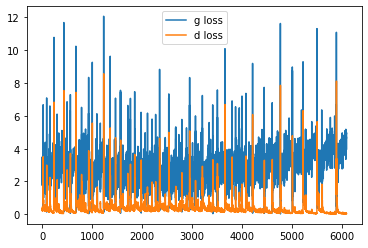

it: 6297; g_loss: 3.3676509857177734; d_loss: 0.06501130759716034; avg_real_score: 0.9849194288253784; avg_fake_score: 0.05563679337501526: : 199it [00:09, 22.00it/s]

generated images


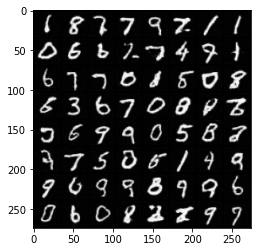

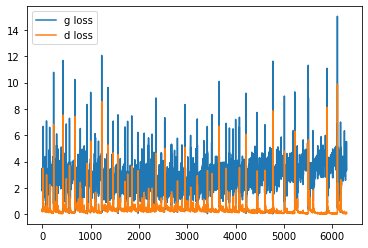

it: 6497; g_loss: 4.497366905212402; d_loss: 0.04137174040079117; avg_real_score: 0.9717166423797607; avg_fake_score: 0.018904877826571465: : 400it [00:19, 20.82it/s] 

generated images


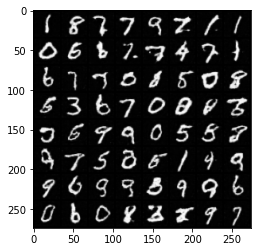

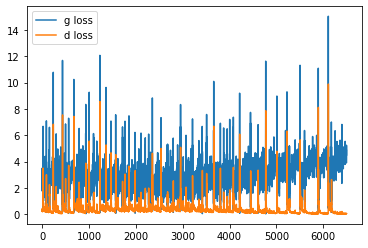

it: 6565; g_loss: 1.2561018466949463; d_loss: 11.548989295959473; avg_real_score: 2.6064793928526342e-05; avg_fake_score: 0.3892337679862976: : 469it [00:23, 20.23it/s]
it: 6566; g_loss: 1.31080961227417; d_loss: 1.1603692770004272; avg_real_score: 0.7978582382202148; avg_fake_score: 0.37426045536994934: : 0it [00:00, ?it/s]

generated images


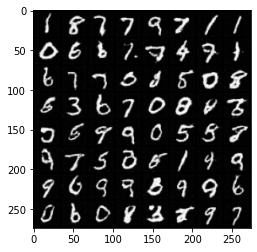

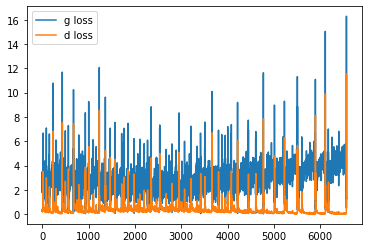

it: 6766; g_loss: 4.407548427581787; d_loss: 0.09652110934257507; avg_real_score: 0.9728571176528931; avg_fake_score: 0.021621057763695717: : 199it [00:09, 20.95it/s]

generated images


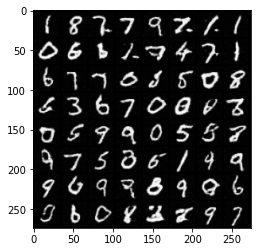

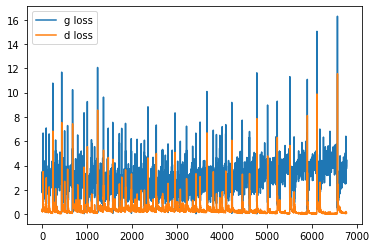

it: 6966; g_loss: 3.379861354827881; d_loss: 0.12758797407150269; avg_real_score: 0.939344048500061; avg_fake_score: 0.05167586728930473: : 400it [00:19, 22.09it/s] 

generated images


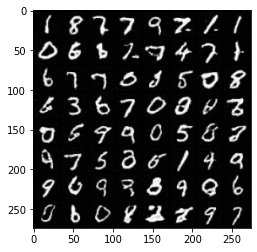

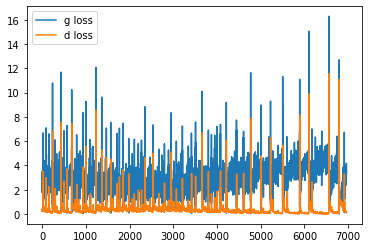

it: 7034; g_loss: 4.483977794647217; d_loss: 0.05302809551358223; avg_real_score: 0.978209912776947; avg_fake_score: 0.01766904629766941: : 469it [00:23, 20.21it/s]
it: 7035; g_loss: 4.515239238739014; d_loss: 0.04789549484848976; avg_real_score: 0.9622560739517212; avg_fake_score: 0.015618838369846344: : 0it [00:00, ?it/s]

generated images


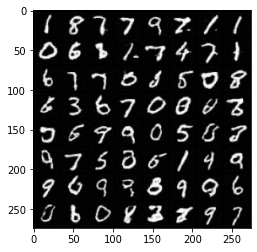

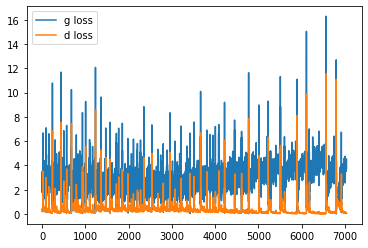

it: 7235; g_loss: 5.151045799255371; d_loss: 0.03540636599063873; avg_real_score: 0.9910714626312256; avg_fake_score: 0.009476438164710999: : 198it [00:09, 21.65it/s]

generated images


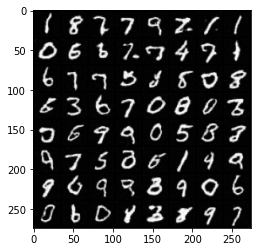

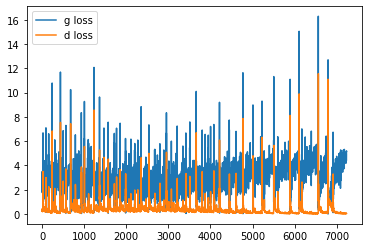

it: 7435; g_loss: 3.594468355178833; d_loss: 0.07983092963695526; avg_real_score: 0.954291820526123; avg_fake_score: 0.03931053727865219: : 399it [00:19, 20.55it/s]   

generated images


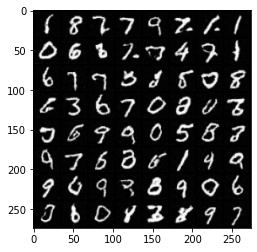

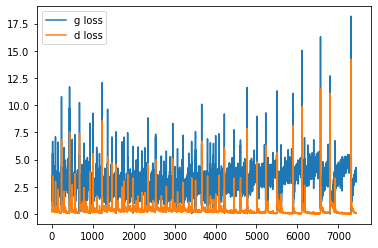

it: 7503; g_loss: 4.487166404724121; d_loss: 0.034166138619184494; avg_real_score: 0.9856162071228027; avg_fake_score: 0.01594655029475689: : 469it [00:23, 20.26it/s]
it: 7504; g_loss: 4.577764511108398; d_loss: 0.06654440611600876; avg_real_score: 0.9824740290641785; avg_fake_score: 0.01700567826628685: : 0it [00:00, ?it/s]

generated images


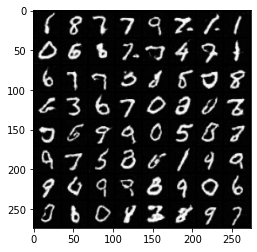

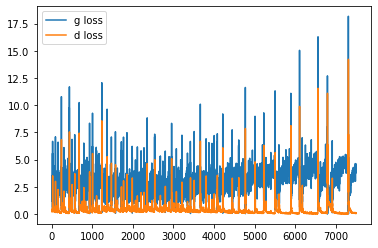

it: 7704; g_loss: 4.946723461151123; d_loss: 0.03297187387943268; avg_real_score: 0.984333872795105; avg_fake_score: 0.01289832778275013: : 199it [00:09, 21.16it/s]  

generated images


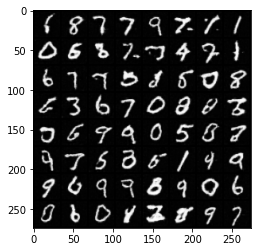

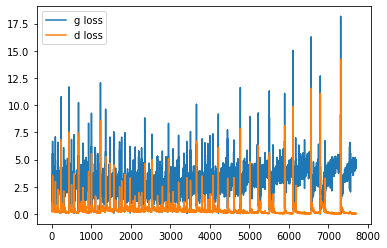

it: 7904; g_loss: 4.658980369567871; d_loss: 0.04056850075721741; avg_real_score: 0.9770456552505493; avg_fake_score: 0.017472339794039726: : 399it [00:19, 21.71it/s]

generated images


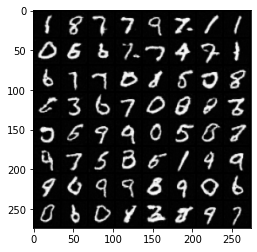

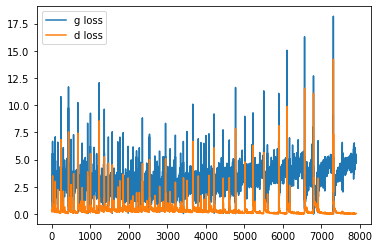

it: 7972; g_loss: 5.049964427947998; d_loss: 0.023873647674918175; avg_real_score: 0.9876880645751953; avg_fake_score: 0.011165020987391472: : 469it [00:23, 20.27it/s]
it: 7973; g_loss: 5.4593095779418945; d_loss: 0.01769746094942093; avg_real_score: 0.9945739507675171; avg_fake_score: 0.007464960217475891: : 0it [00:00, ?it/s]

generated images


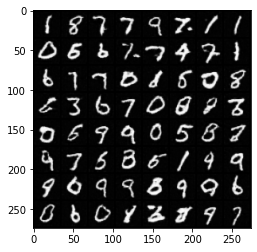

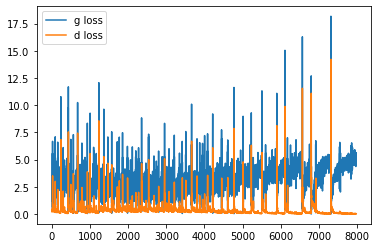

it: 8173; g_loss: 5.560302734375; d_loss: 0.015698324888944626; avg_real_score: 0.9889978170394897; avg_fake_score: 0.007500781677663326: : 198it [00:09, 21.81it/s]  

generated images


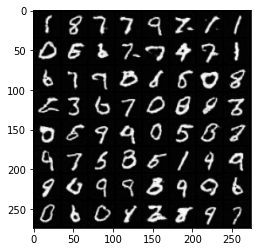

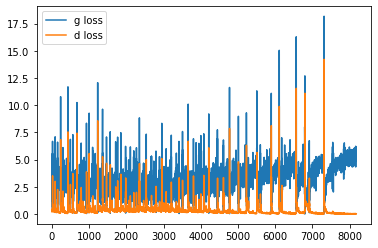

it: 8373; g_loss: 4.063206672668457; d_loss: 0.07183602452278137; avg_real_score: 0.9585037231445312; avg_fake_score: 0.028282945975661278: : 398it [00:19, 20.40it/s]

generated images


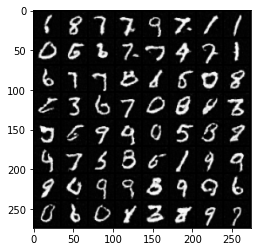

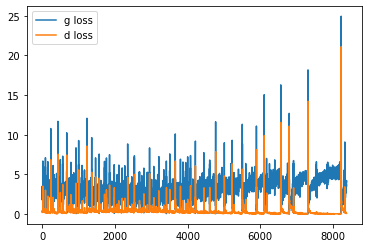

it: 8441; g_loss: 4.633685111999512; d_loss: 0.05870728939771652; avg_real_score: 0.9747366309165955; avg_fake_score: 0.015690727159380913: : 469it [00:22, 20.50it/s]
it: 8442; g_loss: 4.739391803741455; d_loss: 0.04382084682583809; avg_real_score: 0.9694033265113831; avg_fake_score: 0.016651244834065437: : 0it [00:00, ?it/s]

generated images


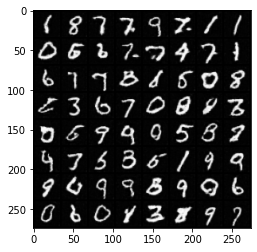

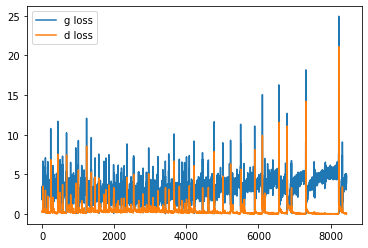

it: 8642; g_loss: 4.686737060546875; d_loss: 0.024463791400194168; avg_real_score: 0.9892938137054443; avg_fake_score: 0.015372506342828274: : 199it [00:09, 22.17it/s]

generated images


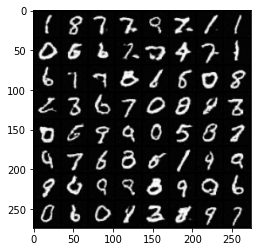

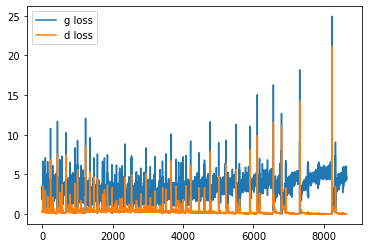

it: 8842; g_loss: 5.181628227233887; d_loss: 0.016122758388519287; avg_real_score: 0.9958460330963135; avg_fake_score: 0.010356677696108818: : 399it [00:19, 23.30it/s]

generated images


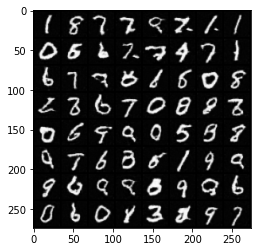

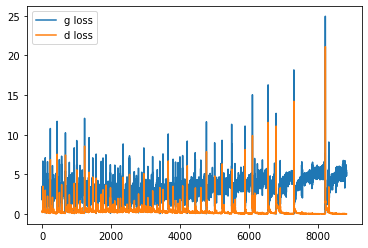

it: 8910; g_loss: 6.059115886688232; d_loss: 0.046734269708395004; avg_real_score: 0.9936671257019043; avg_fake_score: 0.003769978880882263: : 469it [00:22, 20.63it/s]
it: 8911; g_loss: 3.980374813079834; d_loss: 0.04724830761551857; avg_real_score: 0.9580245018005371; avg_fake_score: 0.03234914317727089: : 0it [00:00, ?it/s]

generated images


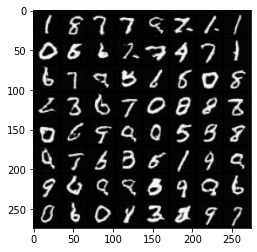

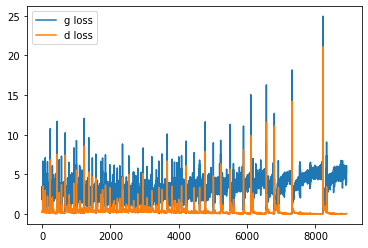

it: 9111; g_loss: 1.8674156665802002; d_loss: 0.5151626467704773; avg_real_score: 0.7342888116836548; avg_fake_score: 0.20461149513721466: : 200it [00:09, 22.57it/s]

generated images


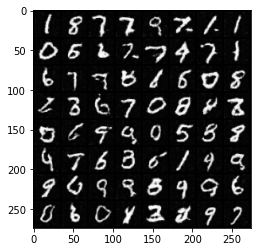

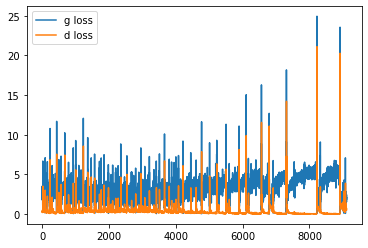

it: 9311; g_loss: 4.601836204528809; d_loss: 0.04307679831981659; avg_real_score: 0.9711931943893433; avg_fake_score: 0.01691381447017193: : 399it [00:19, 21.50it/s] 

generated images


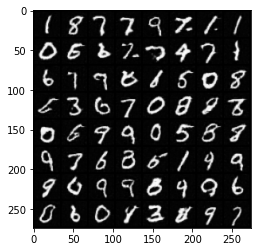

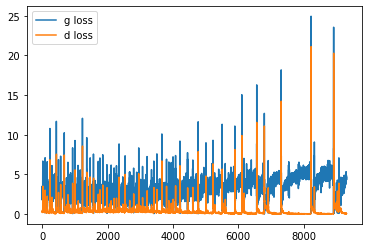

it: 9379; g_loss: 2.404623508453369; d_loss: 0.5098955631256104; avg_real_score: 0.7939565181732178; avg_fake_score: 0.1224280446767807: : 469it [00:23, 20.36it/s]
it: 9380; g_loss: 1.6120326519012451; d_loss: 0.4768904745578766; avg_real_score: 0.741858959197998; avg_fake_score: 0.2432621866464615: : 0it [00:00, ?it/s]

generated images


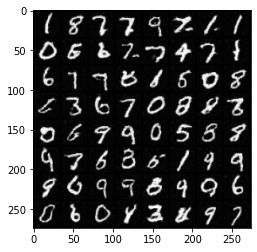

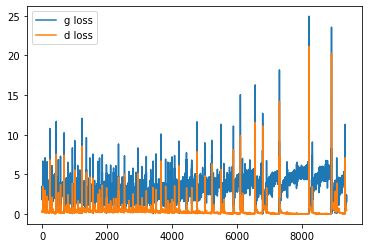

it: 9580; g_loss: 4.462651252746582; d_loss: 0.03295470029115677; avg_real_score: 0.99318927526474; avg_fake_score: 0.020062599331140518: : 199it [00:09, 22.20it/s]  

generated images


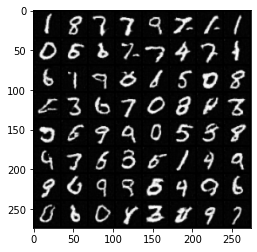

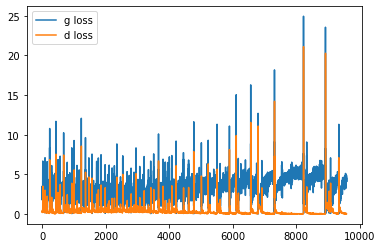

it: 9780; g_loss: 4.262534141540527; d_loss: 0.04507017880678177; avg_real_score: 0.9610811471939087; avg_fake_score: 0.02534164860844612: : 400it [00:19, 21.37it/s] 

generated images


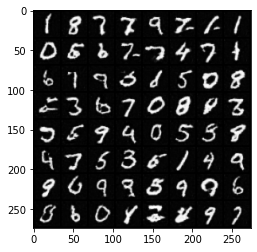

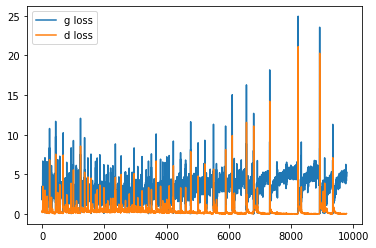

it: 9848; g_loss: 5.036482810974121; d_loss: 0.033113569021224976; avg_real_score: 0.974463939666748; avg_fake_score: 0.01037151925265789: : 469it [00:22, 20.65it/s]
it: 9849; g_loss: 4.786701202392578; d_loss: 0.019813721999526024; avg_real_score: 0.9912245273590088; avg_fake_score: 0.014372948557138443: : 0it [00:00, ?it/s]

generated images


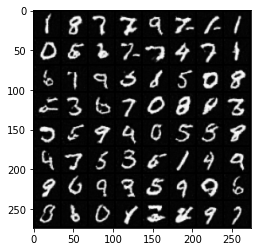

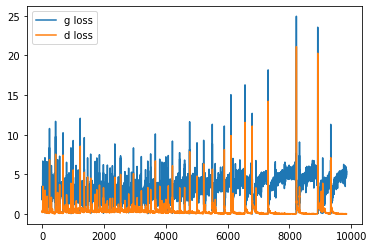

it: 10049; g_loss: 4.830681324005127; d_loss: 0.18561212718486786; avg_real_score: 0.9919053316116333; avg_fake_score: 0.012426860630512238: : 199it [00:09, 22.39it/s]

generated images


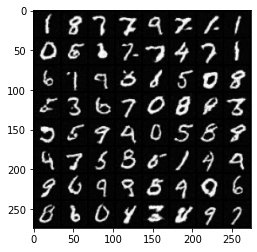

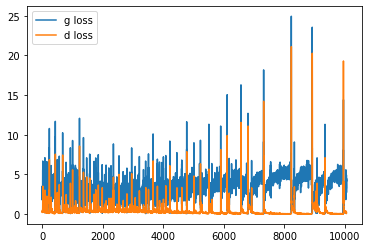

it: 10249; g_loss: 4.673685073852539; d_loss: 0.04283028841018677; avg_real_score: 0.9832545518875122; avg_fake_score: 0.014131597243249416: : 399it [00:19, 21.60it/s]

generated images


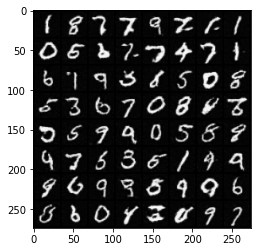

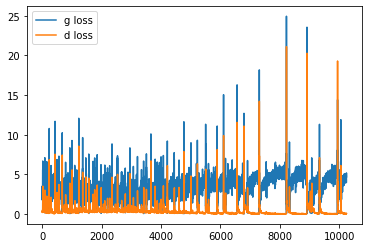

it: 10317; g_loss: 5.390389919281006; d_loss: 0.01800684817135334; avg_real_score: 0.9919379949569702; avg_fake_score: 0.009283001534640789: : 469it [00:23, 20.32it/s]
it: 10318; g_loss: 4.994114398956299; d_loss: 0.032620757818222046; avg_real_score: 0.984168291091919; avg_fake_score: 0.013368545100092888: : 0it [00:00, ?it/s]

generated images


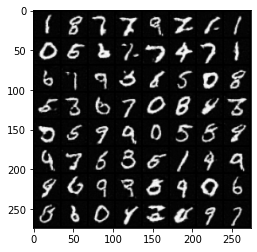

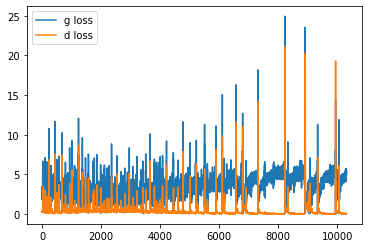

it: 10518; g_loss: 5.8134894371032715; d_loss: 0.01405247300863266; avg_real_score: 0.9932461380958557; avg_fake_score: 0.005769665353000164: : 199it [00:09, 21.88it/s]

generated images


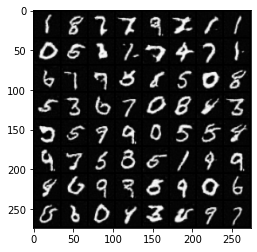

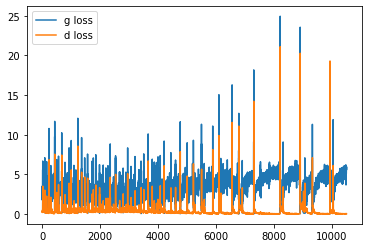

it: 10718; g_loss: 3.7649989128112793; d_loss: 0.09384194016456604; avg_real_score: 0.9435264468193054; avg_fake_score: 0.042491186410188675: : 400it [00:19, 19.95it/s]

generated images


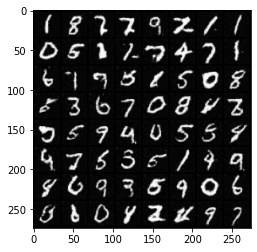

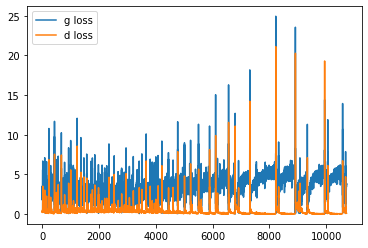

it: 10786; g_loss: 4.493767261505127; d_loss: 0.054751526564359665; avg_real_score: 0.9752023220062256; avg_fake_score: 0.02160150185227394: : 469it [00:23, 20.20it/s]
it: 10787; g_loss: 4.387785911560059; d_loss: 0.040168821811676025; avg_real_score: 0.9724819660186768; avg_fake_score: 0.02130427211523056: : 0it [00:00, ?it/s]

generated images


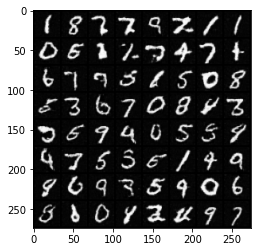

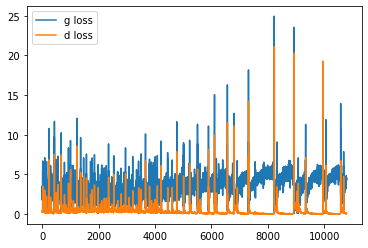

it: 10987; g_loss: 6.320825576782227; d_loss: 0.07569899410009384; avg_real_score: 0.9951614141464233; avg_fake_score: 0.0028772964142262936: : 199it [00:09, 22.18it/s]

generated images


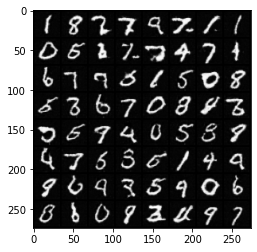

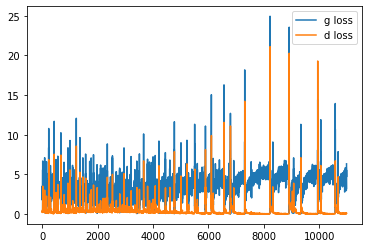

it: 11187; g_loss: 5.2627105712890625; d_loss: 0.017234116792678833; avg_real_score: 0.9919251203536987; avg_fake_score: 0.009493062272667885: : 400it [00:19, 22.53it/s]

generated images


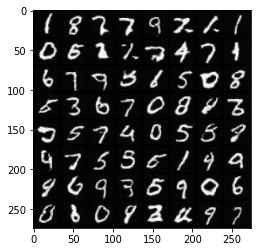

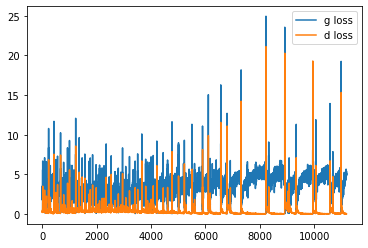

it: 11255; g_loss: 4.8675856590271; d_loss: 0.023954426869750023; avg_real_score: 0.9888710379600525; avg_fake_score: 0.013398222625255585: : 469it [00:22, 20.46it/s]
it: 11256; g_loss: 5.326519012451172; d_loss: 0.019035693258047104; avg_real_score: 0.9937430024147034; avg_fake_score: 0.008208237588405609: : 0it [00:00, ?it/s]

generated images


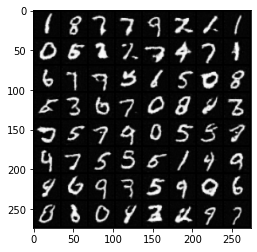

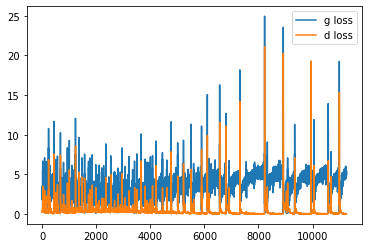

it: 11456; g_loss: 5.417624473571777; d_loss: 0.013782132416963577; avg_real_score: 0.994301974773407; avg_fake_score: 0.00744662107899785: : 199it [00:09, 22.53it/s] 

generated images


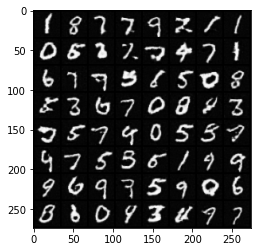

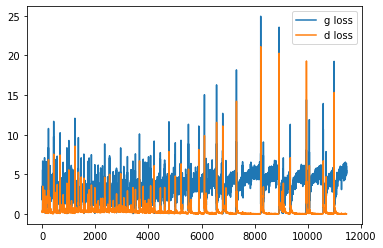

it: 11656; g_loss: 5.879525184631348; d_loss: 0.01303563080728054; avg_real_score: 0.9935766458511353; avg_fake_score: 0.004846935160458088: : 400it [00:19, 22.04it/s]

generated images


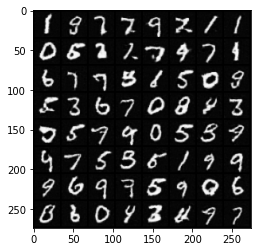

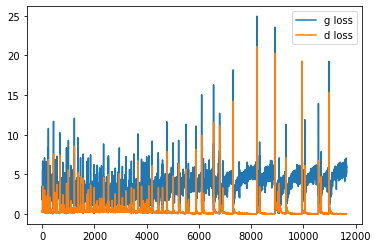

it: 11724; g_loss: 5.7943572998046875; d_loss: 0.01596168428659439; avg_real_score: 0.987718939781189; avg_fake_score: 0.005625031888484955: : 469it [00:23, 20.19it/s]
it: 11725; g_loss: 5.439289569854736; d_loss: 0.019144367426633835; avg_real_score: 0.9930750131607056; avg_fake_score: 0.007950810715556145: : 0it [00:00, ?it/s]

generated images


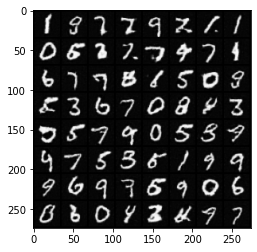

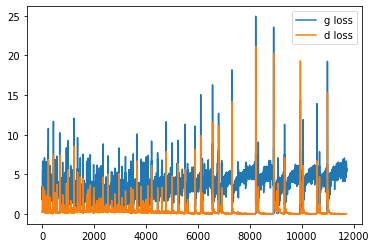

it: 11925; g_loss: 3.258465051651001; d_loss: 0.37812867760658264; avg_real_score: 0.8969959020614624; avg_fake_score: 0.05798592418432236: : 198it [00:09, 21.33it/s]

generated images


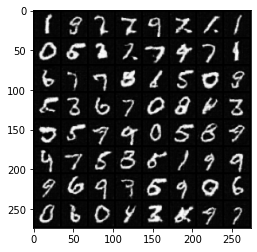

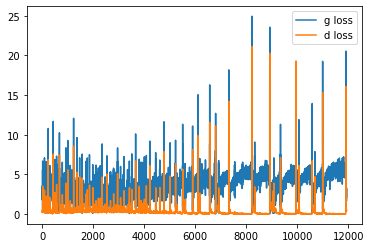

it: 12125; g_loss: 4.278747081756592; d_loss: 0.04228585213422775; avg_real_score: 0.9734365344047546; avg_fake_score: 0.028892692178487778: : 398it [00:19, 21.69it/s] 

generated images


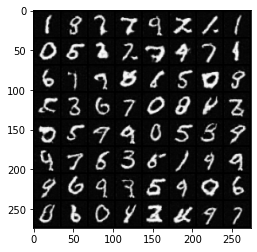

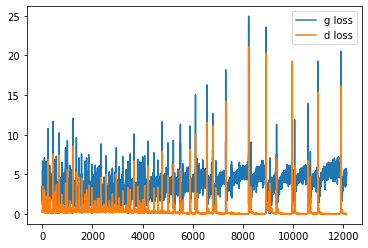

it: 12193; g_loss: 5.439382076263428; d_loss: 0.028349122032523155; avg_real_score: 0.9965000152587891; avg_fake_score: 0.008159439079463482: : 469it [00:23, 20.38it/s]
it: 12194; g_loss: 5.687499046325684; d_loss: 0.01805301010608673; avg_real_score: 0.9867198467254639; avg_fake_score: 0.005756414495408535: : 0it [00:00, ?it/s]

generated images


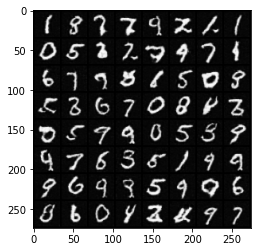

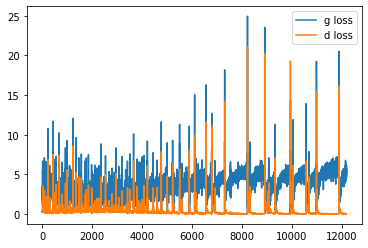

it: 12394; g_loss: 7.149414539337158; d_loss: 0.01714765839278698; avg_real_score: 0.9846048951148987; avg_fake_score: 0.0015742771793156862: : 199it [00:09, 21.46it/s]

generated images


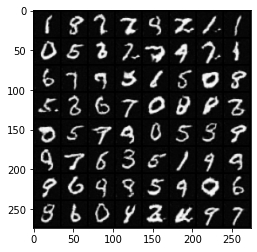

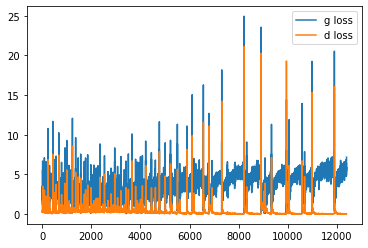

it: 12594; g_loss: 2.0875911712646484; d_loss: 5.435811519622803; avg_real_score: 0.020387962460517883; avg_fake_score: 0.22758936882019043: : 400it [00:19, 19.73it/s]

generated images


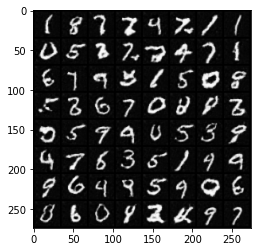

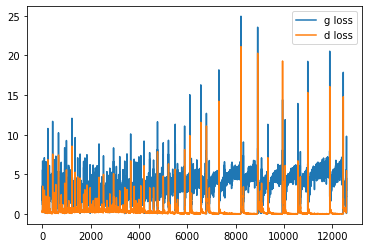

it: 12662; g_loss: 4.2688751220703125; d_loss: 0.04679904878139496; avg_real_score: 0.9823662638664246; avg_fake_score: 0.02468910440802574: : 469it [00:22, 20.41it/s]
it: 12663; g_loss: 5.254631519317627; d_loss: 0.0795425996184349; avg_real_score: 0.988174557685852; avg_fake_score: 0.008897104300558567: : 0it [00:00, ?it/s]

generated images


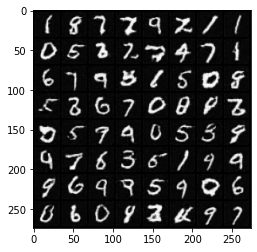

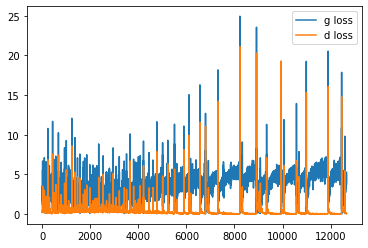

it: 12863; g_loss: 5.583086013793945; d_loss: 0.018734510987997055; avg_real_score: 0.9909076690673828; avg_fake_score: 0.0065148817375302315: : 198it [00:09, 21.84it/s]

generated images


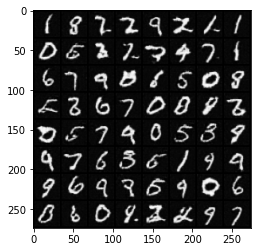

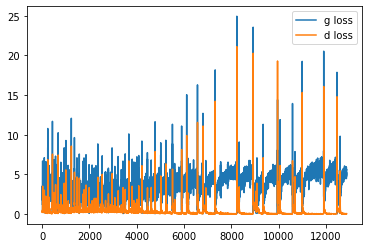

it: 13063; g_loss: 5.717124938964844; d_loss: 0.018636498600244522; avg_real_score: 0.9940013885498047; avg_fake_score: 0.006667364854365587: : 399it [00:19, 20.59it/s] 

generated images


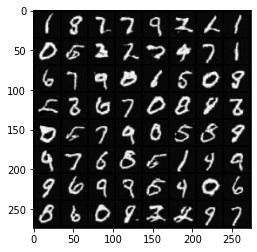

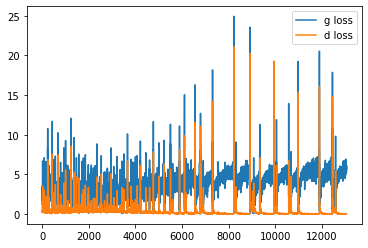

it: 13131; g_loss: 5.669347286224365; d_loss: 0.013294924050569534; avg_real_score: 0.9905878901481628; avg_fake_score: 0.007009755354374647: : 469it [00:23, 20.18it/s]
it: 13132; g_loss: 5.579807758331299; d_loss: 0.012051573023200035; avg_real_score: 0.9974764585494995; avg_fake_score: 0.006689812522381544: : 0it [00:00, ?it/s]

generated images


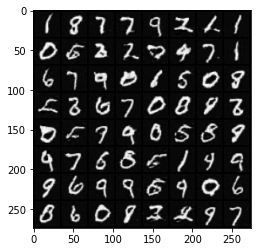

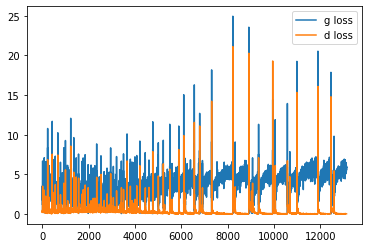

it: 13332; g_loss: 5.491844177246094; d_loss: 0.010942637920379639; avg_real_score: 0.9962262511253357; avg_fake_score: 0.007898714393377304: : 198it [00:09, 21.91it/s]

generated images


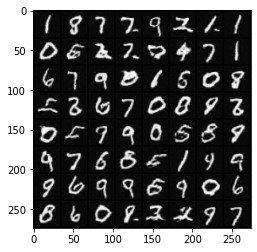

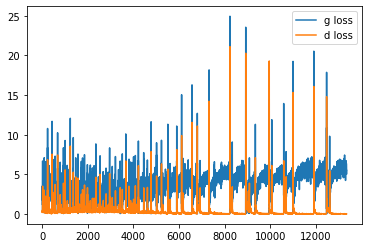

it: 13532; g_loss: 4.89827299118042; d_loss: 0.05895261839032173; avg_real_score: 0.9772075414657593; avg_fake_score: 0.013804452493786812: : 398it [00:19, 22.58it/s]

generated images


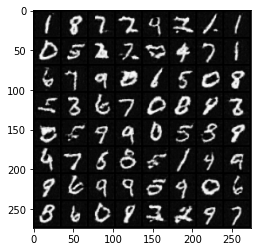

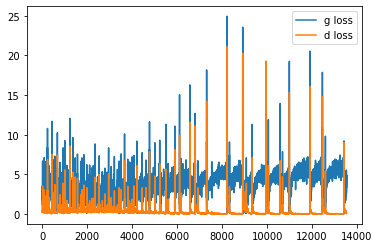

it: 13600; g_loss: 8.214922904968262; d_loss: 0.139822855591774; avg_real_score: 0.9993222951889038; avg_fake_score: 0.00044239018461667: : 469it [00:23, 20.11it/s]
it: 13601; g_loss: 6.142177104949951; d_loss: 0.46746790409088135; avg_real_score: 0.6924838423728943; avg_fake_score: 0.006971981842070818: : 0it [00:00, ?it/s]

generated images


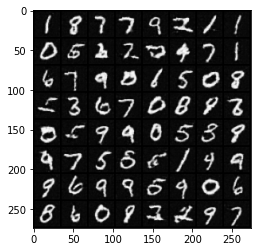

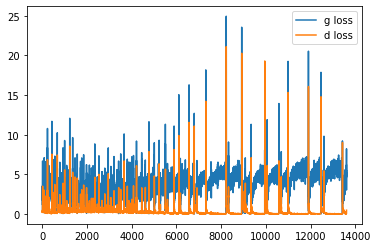

it: 13801; g_loss: 5.286825180053711; d_loss: 0.03038370981812477; avg_real_score: 0.996268630027771; avg_fake_score: 0.00956347119063139: : 200it [00:09, 19.78it/s] 

generated images


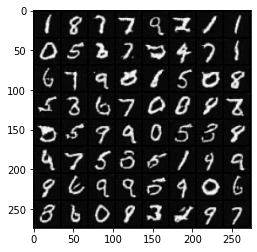

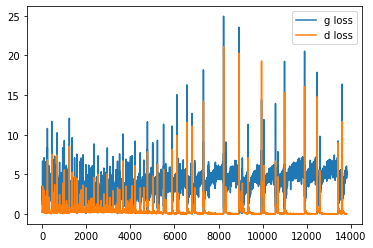

it: 14001; g_loss: 5.1438069343566895; d_loss: 0.014665164053440094; avg_real_score: 0.9934931993484497; avg_fake_score: 0.010246200487017632: : 399it [00:19, 21.07it/s]

generated images


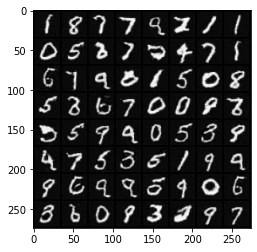

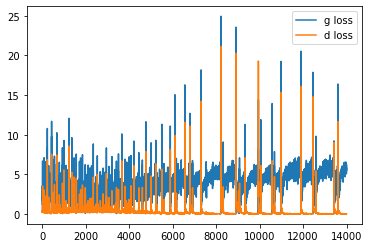

it: 14069; g_loss: 3.8773088455200195; d_loss: 0.5161567330360413; avg_real_score: 0.942816436290741; avg_fake_score: 0.031147271394729614: : 469it [00:23, 20.12it/s]
it: 14070; g_loss: 1.7911202907562256; d_loss: 0.49861621856689453; avg_real_score: 0.6954531669616699; avg_fake_score: 0.23444412648677826: : 0it [00:00, ?it/s]

generated images


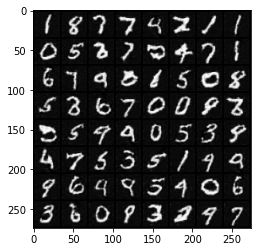

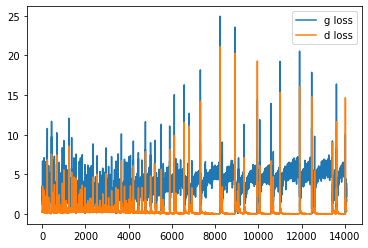

it: 14270; g_loss: 2.4104180335998535; d_loss: 0.3807161748409271; avg_real_score: 0.8396375179290771; avg_fake_score: 0.12847894430160522: : 199it [00:09, 21.13it/s]

generated images


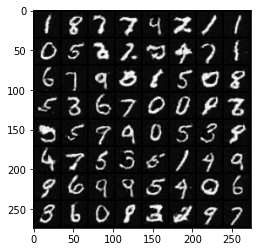

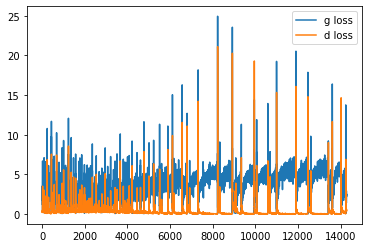

it: 14470; g_loss: 5.071388244628906; d_loss: 0.02677585557103157; avg_real_score: 0.9910966753959656; avg_fake_score: 0.009856089949607849: : 400it [00:19, 21.85it/s] 

generated images


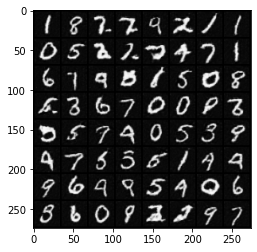

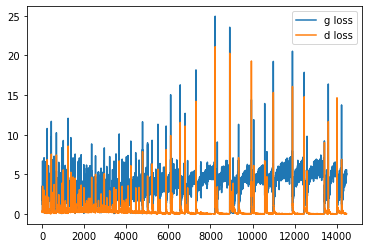

it: 14538; g_loss: 3.803046703338623; d_loss: 0.41712626814842224; avg_real_score: 0.9631922245025635; avg_fake_score: 0.03205985575914383: : 469it [00:23, 20.16it/s]
it: 14539; g_loss: 2.787853240966797; d_loss: 0.37974774837493896; avg_real_score: 0.7559971809387207; avg_fake_score: 0.09095820039510727: : 0it [00:00, ?it/s]

generated images


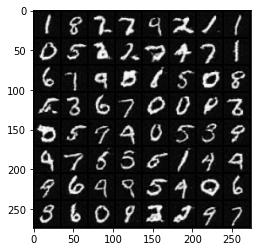

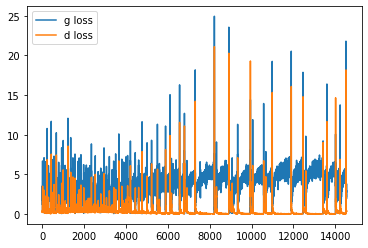

it: 14739; g_loss: 4.709892272949219; d_loss: 0.027067366987466812; avg_real_score: 0.994817852973938; avg_fake_score: 0.014943497255444527: : 200it [00:09, 22.21it/s]

generated images


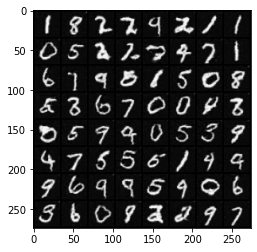

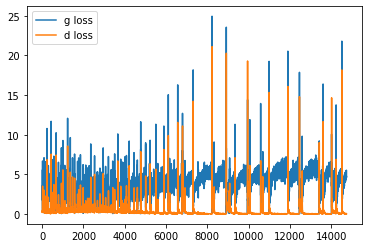

it: 14939; g_loss: 5.6432085037231445; d_loss: 0.02179839089512825; avg_real_score: 0.9940468072891235; avg_fake_score: 0.007604413665831089: : 398it [00:19, 21.65it/s]

generated images


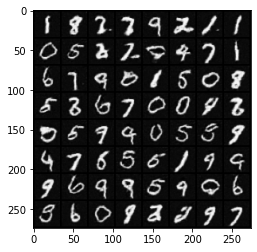

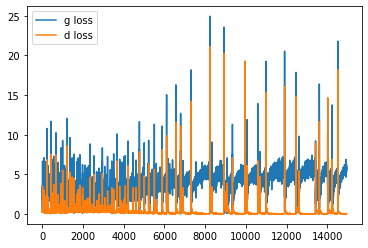

it: 15007; g_loss: 6.1891093254089355; d_loss: 0.009089373052120209; avg_real_score: 0.9939934611320496; avg_fake_score: 0.003687311662361026: : 469it [00:23, 20.18it/s]
it: 15008; g_loss: 5.851996421813965; d_loss: 0.010893292725086212; avg_real_score: 0.9930312633514404; avg_fake_score: 0.004865582101047039: : 0it [00:00, ?it/s]

generated images


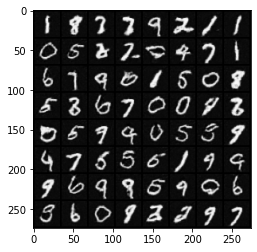

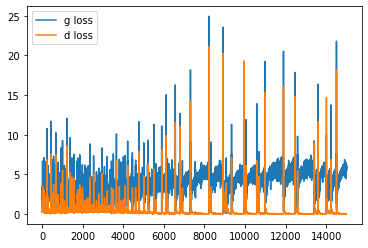

it: 15208; g_loss: 4.459755897521973; d_loss: 0.03954426199197769; avg_real_score: 0.9797564744949341; avg_fake_score: 0.017287198454141617: : 199it [00:09, 22.34it/s]

generated images


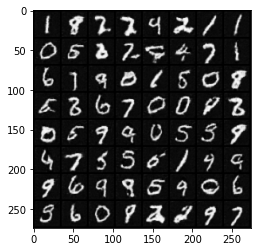

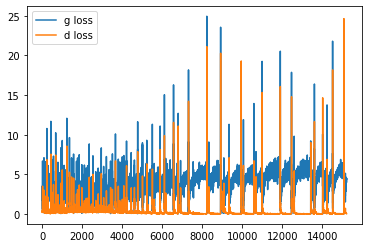

it: 15408; g_loss: 5.323005676269531; d_loss: 0.01923459582030773; avg_real_score: 0.9880111217498779; avg_fake_score: 0.00882552657276392: : 399it [00:19, 22.56it/s]

generated images


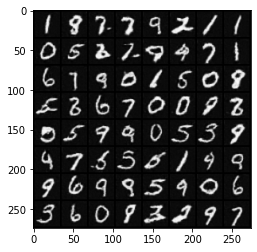

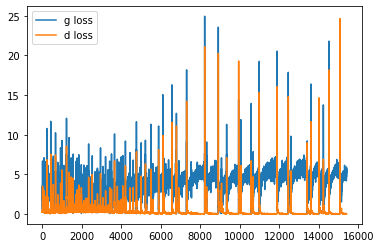

it: 15476; g_loss: 7.18307638168335; d_loss: 0.005603031720966101; avg_real_score: 0.9962425231933594; avg_fake_score: 0.0014995395904406905: : 469it [00:22, 20.51it/s]
it: 15477; g_loss: 6.051984786987305; d_loss: 0.013093847781419754; avg_real_score: 0.9898769855499268; avg_fake_score: 0.004348456859588623: : 0it [00:00, ?it/s]

generated images


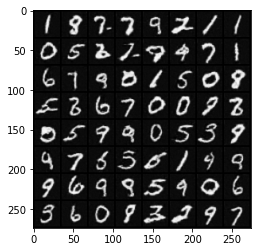

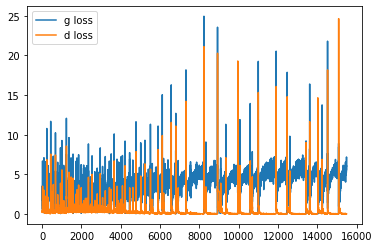

it: 15677; g_loss: 6.4259033203125; d_loss: 0.009996335953474045; avg_real_score: 0.9970861077308655; avg_fake_score: 0.0027908100746572018: : 199it [00:09, 22.87it/s] 

generated images


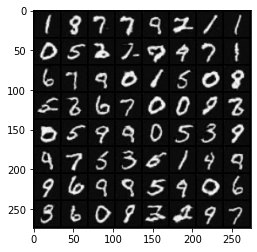

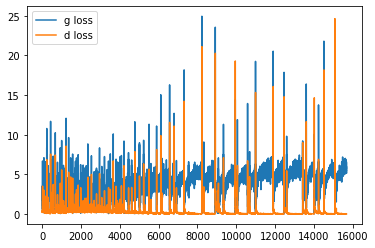

it: 15877; g_loss: 6.6081743240356445; d_loss: 0.005790951661765575; avg_real_score: 0.9982510209083557; avg_fake_score: 0.002283151261508465: : 400it [00:19, 21.02it/s]

generated images


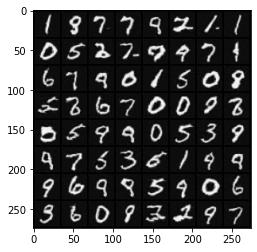

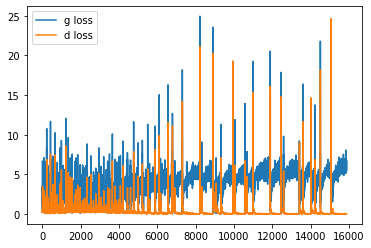

it: 15945; g_loss: 5.842639446258545; d_loss: 0.014882747083902359; avg_real_score: 0.9930304884910583; avg_fake_score: 0.00466651376336813: : 469it [00:22, 20.45it/s]
it: 15946; g_loss: 6.271535873413086; d_loss: 0.008516903966665268; avg_real_score: 0.9950249195098877; avg_fake_score: 0.003798286197707057: : 0it [00:00, ?it/s]

generated images


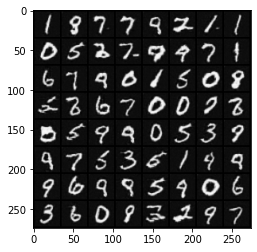

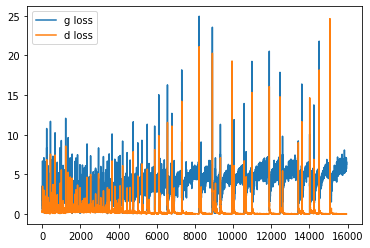

it: 16146; g_loss: 6.11296272277832; d_loss: 0.0072373938746750355; avg_real_score: 0.9977203607559204; avg_fake_score: 0.003752294695004821: : 199it [00:09, 22.16it/s] 

generated images


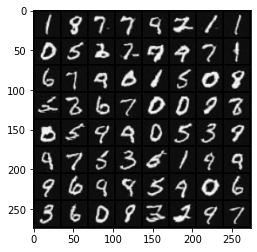

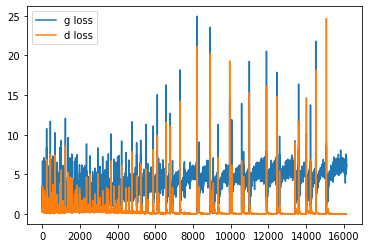

it: 16346; g_loss: 3.1737940311431885; d_loss: 0.7213793992996216; avg_real_score: 0.8791576623916626; avg_fake_score: 0.06721560657024384: : 399it [00:19, 20.48it/s]

generated images


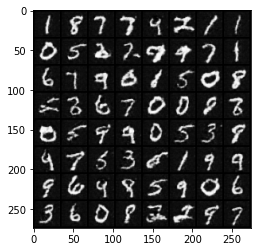

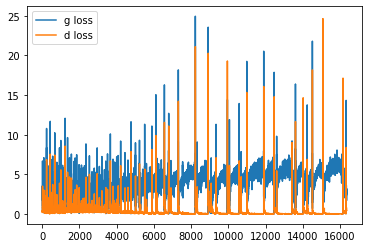

it: 16414; g_loss: 4.196030139923096; d_loss: 0.20735694468021393; avg_real_score: 0.9797391891479492; avg_fake_score: 0.024197280406951904: : 469it [00:23, 20.22it/s]
it: 16415; g_loss: 4.317265510559082; d_loss: 0.13822025060653687; avg_real_score: 0.9379345178604126; avg_fake_score: 0.023465506732463837: : 0it [00:00, ?it/s]

generated images


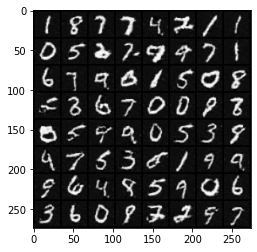

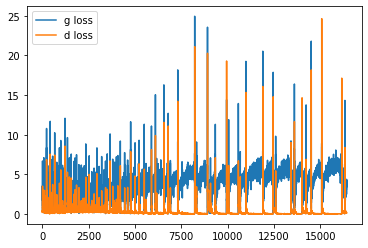

it: 16615; g_loss: 3.7879390716552734; d_loss: 0.07242976129055023; avg_real_score: 0.9597693681716919; avg_fake_score: 0.03887805715203285: : 200it [00:10, 21.59it/s]

generated images


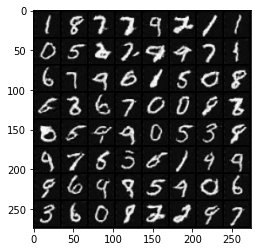

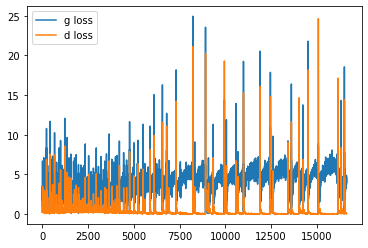

it: 16815; g_loss: 2.618602991104126; d_loss: 0.16977040469646454; avg_real_score: 0.8979967832565308; avg_fake_score: 0.1049451231956482: : 399it [00:19, 22.25it/s] 

generated images


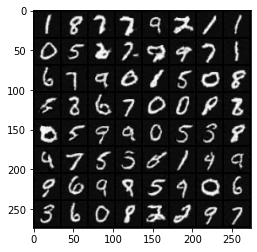

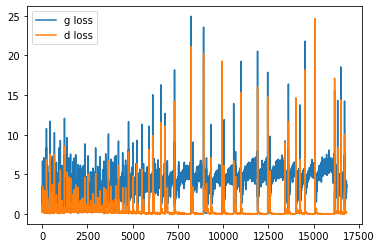

it: 16883; g_loss: 5.042146682739258; d_loss: 0.04245584458112717; avg_real_score: 0.9784330129623413; avg_fake_score: 0.012479746714234352: : 469it [00:23, 20.10it/s]
it: 16884; g_loss: 3.273256540298462; d_loss: 0.08854486048221588; avg_real_score: 0.9369953870773315; avg_fake_score: 0.05894343927502632: : 0it [00:00, ?it/s]

generated images


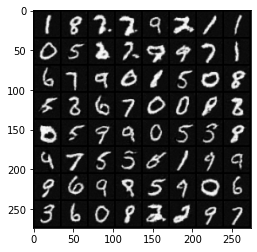

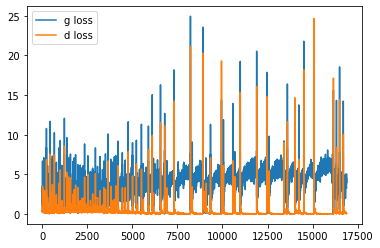

it: 17084; g_loss: 4.9637980461120605; d_loss: 0.031230870634317398; avg_real_score: 0.9728453159332275; avg_fake_score: 0.01183327380567789: : 198it [00:09, 19.53it/s]

generated images


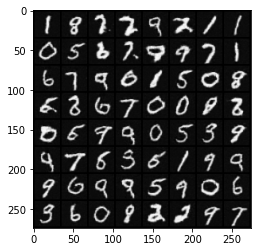

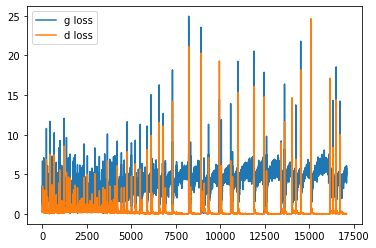

it: 17284; g_loss: 5.159519195556641; d_loss: 0.0228404700756073; avg_real_score: 0.9924749135971069; avg_fake_score: 0.00997784174978733: : 398it [00:19, 20.94it/s]   

generated images


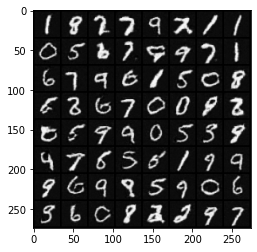

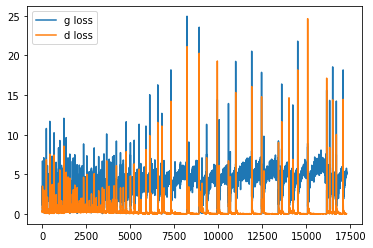

it: 17352; g_loss: 5.474911689758301; d_loss: 0.013444528914988041; avg_real_score: 0.9925572276115417; avg_fake_score: 0.006682045757770538: : 469it [00:23, 20.12it/s]
it: 17353; g_loss: 5.653937339782715; d_loss: 0.015022044070065022; avg_real_score: 0.9948609471321106; avg_fake_score: 0.007412554696202278: : 0it [00:00, ?it/s]

generated images


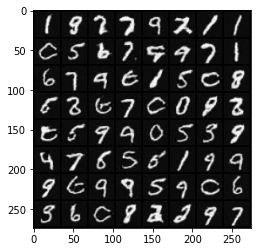

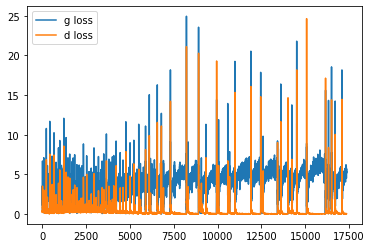

it: 17553; g_loss: 6.0361151695251465; d_loss: 0.026069100946187973; avg_real_score: 0.9965635538101196; avg_fake_score: 0.0045850262977182865: : 199it [00:09, 21.34it/s]

generated images


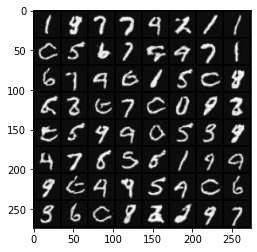

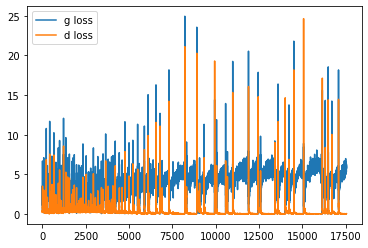

it: 17753; g_loss: 6.031763553619385; d_loss: 0.019048215821385384; avg_real_score: 0.9983788132667542; avg_fake_score: 0.004354264587163925: : 399it [00:19, 21.52it/s] 

generated images


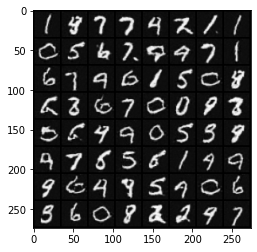

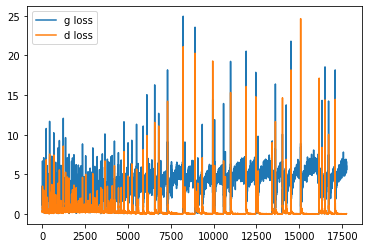

it: 17821; g_loss: 5.978334426879883; d_loss: 0.010864567011594772; avg_real_score: 0.9949862957000732; avg_fake_score: 0.0045010242611169815: : 469it [00:23, 19.94it/s]
it: 17822; g_loss: 6.34735107421875; d_loss: 0.012429951690137386; avg_real_score: 0.9892776012420654; avg_fake_score: 0.0031739925034344196: : 0it [00:00, ?it/s]

generated images


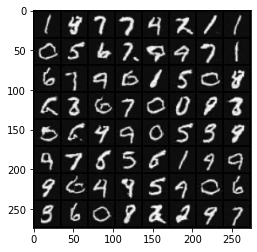

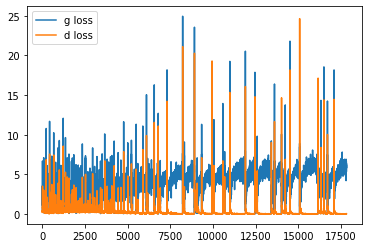

it: 18022; g_loss: 3.24819016456604; d_loss: 0.17358341813087463; avg_real_score: 0.917926013469696; avg_fake_score: 0.06313195824623108: : 200it [00:09, 20.65it/s] 

generated images


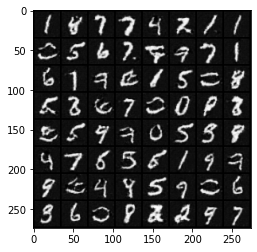

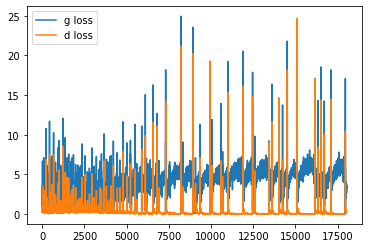

it: 18222; g_loss: 4.105527400970459; d_loss: 0.058521807193756104; avg_real_score: 0.9670071005821228; avg_fake_score: 0.026807457208633423: : 398it [00:19, 22.27it/s]

generated images


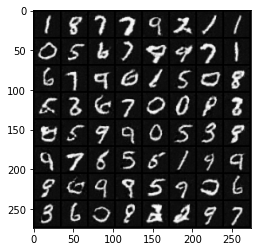

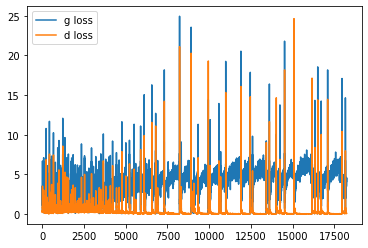

it: 18290; g_loss: 4.638549327850342; d_loss: 0.051257357001304626; avg_real_score: 0.974239706993103; avg_fake_score: 0.01681794598698616: : 469it [00:23, 20.10it/s]
it: 18291; g_loss: 4.139398097991943; d_loss: 0.053226470947265625; avg_real_score: 0.963659405708313; avg_fake_score: 0.025390157476067543: : 0it [00:00, ?it/s]

generated images


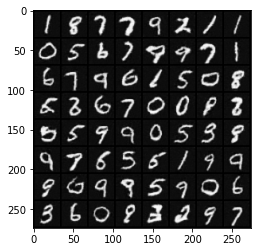

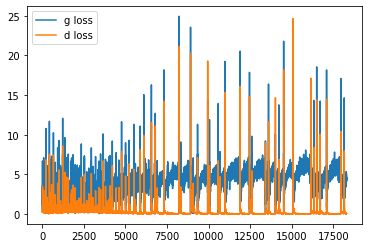

it: 18491; g_loss: 5.321658611297607; d_loss: 0.018989145755767822; avg_real_score: 0.9855568408966064; avg_fake_score: 0.008177264593541622: : 200it [00:09, 21.79it/s]

generated images


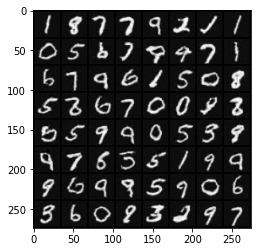

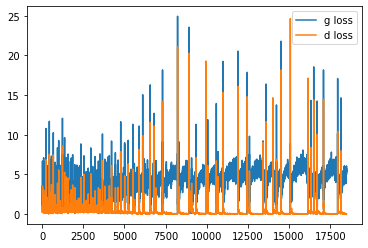

it: 18691; g_loss: 6.564670562744141; d_loss: 0.006477002054452896; avg_real_score: 0.9980195164680481; avg_fake_score: 0.002911744639277458: : 398it [00:19, 20.34it/s] 

generated images


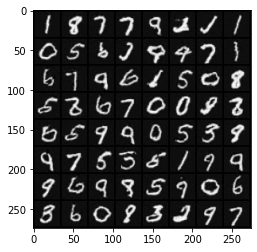

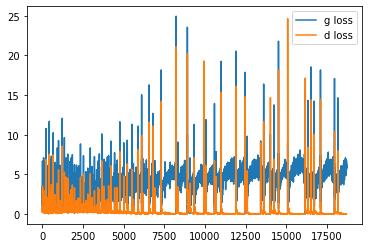

it: 18759; g_loss: 6.184661388397217; d_loss: 0.009701400995254517; avg_real_score: 0.9982799291610718; avg_fake_score: 0.004396469332277775: : 469it [00:22, 20.43it/s]
it: 18760; g_loss: 6.830061435699463; d_loss: 0.006269935984164476; avg_real_score: 0.9959887266159058; avg_fake_score: 0.002005613874644041: : 0it [00:00, ?it/s]

generated images


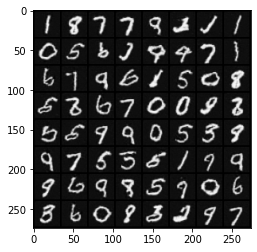

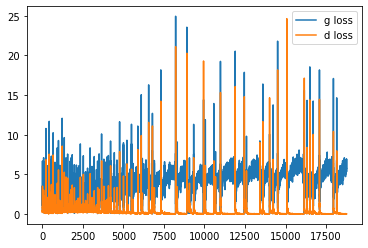

it: 18960; g_loss: 6.56819486618042; d_loss: 0.009193377569317818; avg_real_score: 0.9970634579658508; avg_fake_score: 0.002909732051193714: : 199it [00:09, 21.21it/s]

generated images


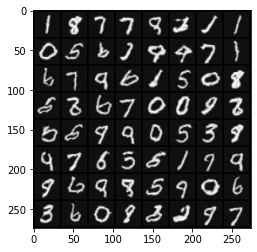

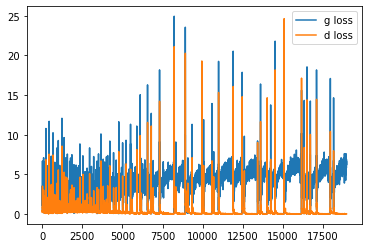

it: 19160; g_loss: 6.108059883117676; d_loss: 0.006567620672285557; avg_real_score: 0.9984680414199829; avg_fake_score: 0.004211777821183205: : 400it [00:19, 21.81it/s]

generated images


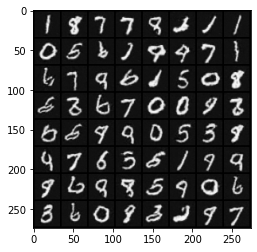

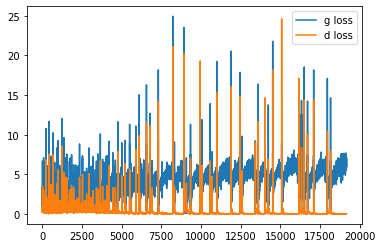

it: 19228; g_loss: 6.022127151489258; d_loss: 0.009162385016679764; avg_real_score: 0.9938572645187378; avg_fake_score: 0.004255957435816526: : 469it [00:23, 19.97it/s]
it: 19229; g_loss: 6.397406578063965; d_loss: 0.006848018616437912; avg_real_score: 0.9974539875984192; avg_fake_score: 0.003340295748785138: : 0it [00:00, ?it/s]

generated images


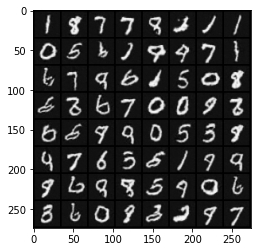

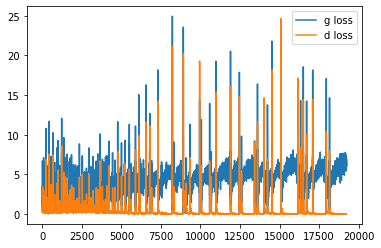

it: 19429; g_loss: 4.376960277557373; d_loss: 0.24619707465171814; avg_real_score: 0.9458295702934265; avg_fake_score: 0.021098721772432327: : 198it [00:09, 22.07it/s]

generated images


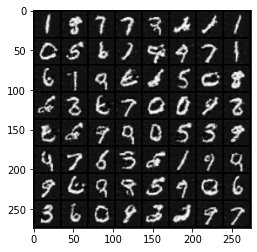

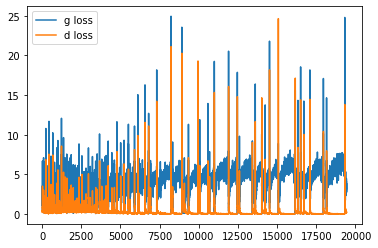

it: 19629; g_loss: 4.021432399749756; d_loss: 0.07943901419639587; avg_real_score: 0.9670167565345764; avg_fake_score: 0.027745280414819717: : 398it [00:19, 21.58it/s]

generated images


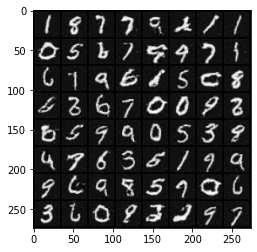

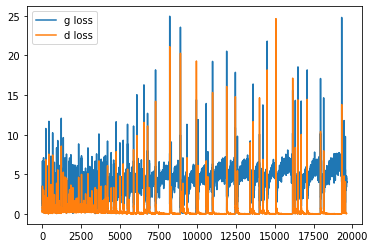

it: 19697; g_loss: 1.9605450630187988; d_loss: 0.6071898937225342; avg_real_score: 0.6940169334411621; avg_fake_score: 0.23467569053173065: : 469it [00:23, 20.36it/s]
it: 19698; g_loss: 3.2508461475372314; d_loss: 0.4764195382595062; avg_real_score: 0.9257707595825195; avg_fake_score: 0.07196956872940063: : 0it [00:00, ?it/s]

generated images


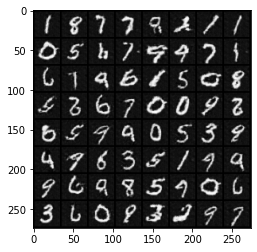

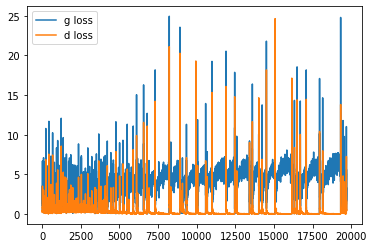

it: 19898; g_loss: 4.441484451293945; d_loss: 0.07811379432678223; avg_real_score: 0.9473907947540283; avg_fake_score: 0.024420935660600662: : 199it [00:09, 20.93it/s]

generated images


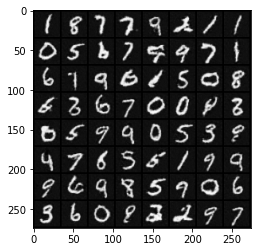

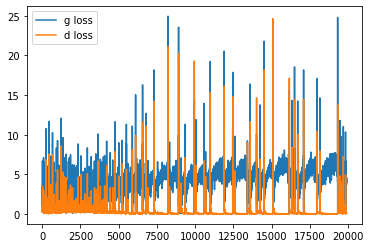

it: 20098; g_loss: 4.872174263000488; d_loss: 0.03175761178135872; avg_real_score: 0.9852907657623291; avg_fake_score: 0.014772380702197552: : 399it [00:19, 22.63it/s]

generated images


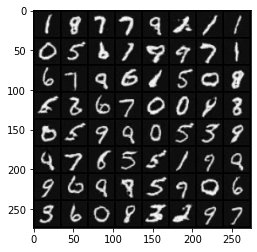

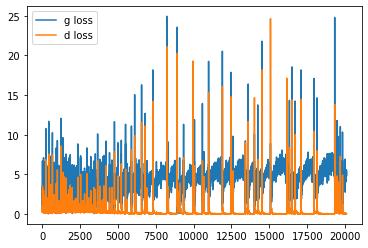

it: 20166; g_loss: 5.461188316345215; d_loss: 0.02977241948246956; avg_real_score: 0.9954313039779663; avg_fake_score: 0.007083038799464703: : 469it [00:23, 20.30it/s]
it: 20167; g_loss: 5.837640762329102; d_loss: 0.01963772438466549; avg_real_score: 0.9889070987701416; avg_fake_score: 0.005146706476807594: : 0it [00:00, ?it/s]

generated images


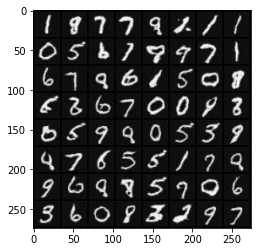

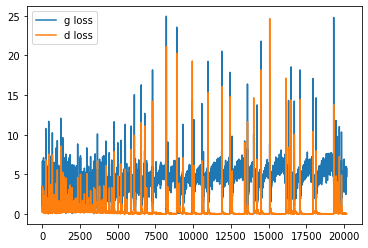

it: 20367; g_loss: 2.9246573448181152; d_loss: 0.23166288435459137; avg_real_score: 0.8845359086990356; avg_fake_score: 0.08785472065210342: : 200it [00:09, 22.35it/s]

generated images


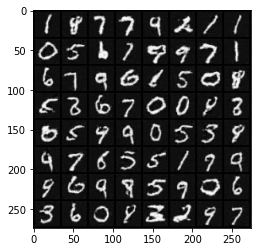

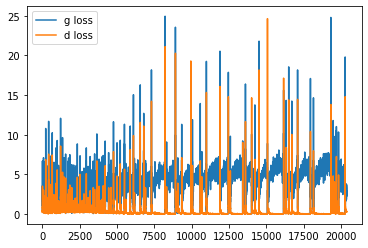

it: 20567; g_loss: 2.8370373249053955; d_loss: 0.24156808853149414; avg_real_score: 0.9322825074195862; avg_fake_score: 0.0914965271949768: : 398it [00:19, 21.96it/s]

generated images


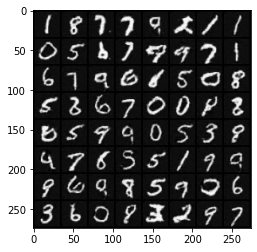

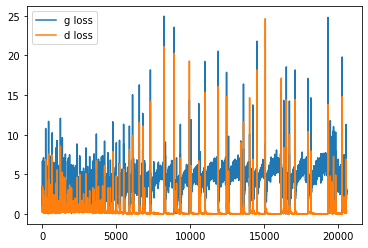

it: 20635; g_loss: 4.424685955047607; d_loss: 0.06993816792964935; avg_real_score: 0.9746979475021362; avg_fake_score: 0.020933782681822777: : 469it [00:23, 20.27it/s]
it: 20636; g_loss: 4.8241963386535645; d_loss: 0.040596671402454376; avg_real_score: 0.9772467613220215; avg_fake_score: 0.01465994119644165: : 0it [00:00, ?it/s]

generated images


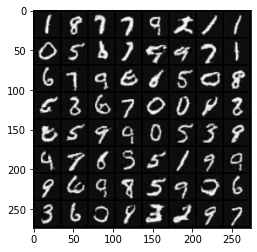

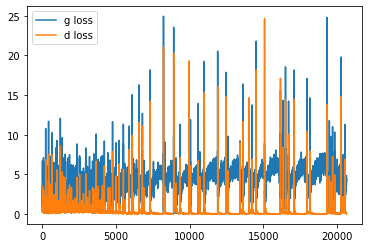

it: 20836; g_loss: 5.483924865722656; d_loss: 0.012864511460065842; avg_real_score: 0.9946386814117432; avg_fake_score: 0.007599809672683477: : 199it [00:09, 21.37it/s]

generated images


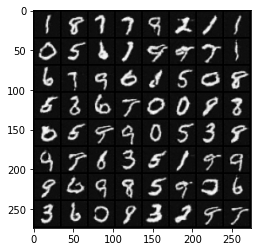

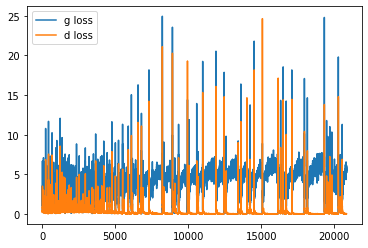

it: 21036; g_loss: 5.660819053649902; d_loss: 0.010766877792775631; avg_real_score: 0.9973992109298706; avg_fake_score: 0.005581102333962917: : 400it [00:19, 20.42it/s]

generated images


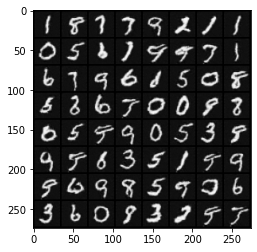

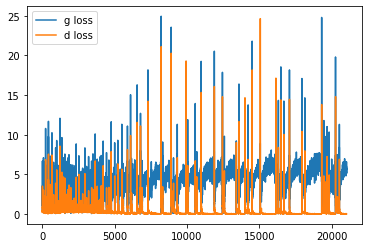

it: 21104; g_loss: 5.7566657066345215; d_loss: 0.01443468313664198; avg_real_score: 0.9908007383346558; avg_fake_score: 0.005785244517028332: : 469it [00:23, 20.22it/s]
it: 21105; g_loss: 5.384272575378418; d_loss: 0.016579141840338707; avg_real_score: 0.9941052794456482; avg_fake_score: 0.008040951564908028: : 0it [00:00, ?it/s]

generated images


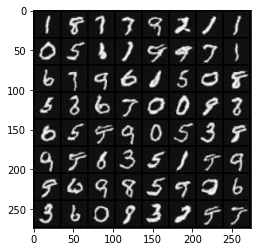

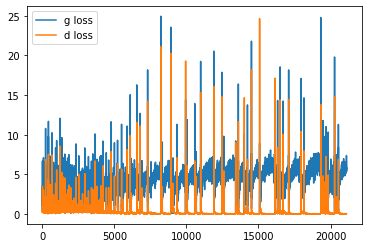

it: 21305; g_loss: 2.8252439498901367; d_loss: 0.2967432141304016; avg_real_score: 0.8772112727165222; avg_fake_score: 0.08577851951122284: : 200it [00:09, 20.12it/s]

generated images


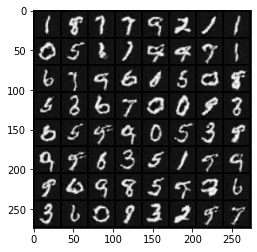

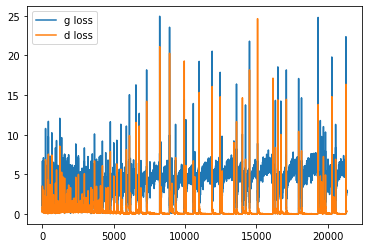

it: 21505; g_loss: 5.259946823120117; d_loss: 0.03026282601058483; avg_real_score: 0.9876494407653809; avg_fake_score: 0.008815190754830837: : 399it [00:19, 21.78it/s]  

generated images


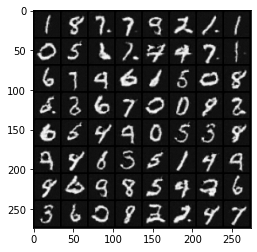

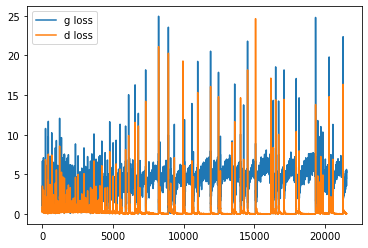

it: 21573; g_loss: 5.850292205810547; d_loss: 0.014785285107791424; avg_real_score: 0.9924373626708984; avg_fake_score: 0.004905750509351492: : 469it [00:23, 20.14it/s]
it: 21574; g_loss: 5.081409931182861; d_loss: 0.028398513793945312; avg_real_score: 0.984613299369812; avg_fake_score: 0.01196829229593277: : 0it [00:00, ?it/s]

generated images


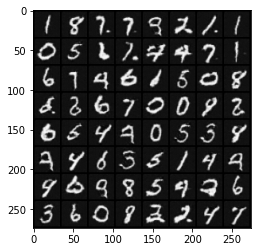

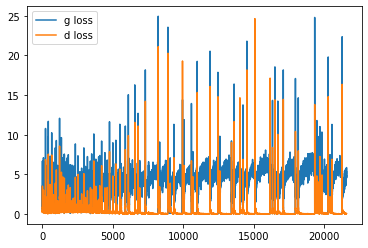

it: 21774; g_loss: 2.6942532062530518; d_loss: 0.551458477973938; avg_real_score: 0.867416262626648; avg_fake_score: 0.11693841218948364: : 198it [00:09, 21.76it/s]

generated images


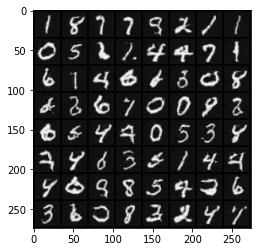

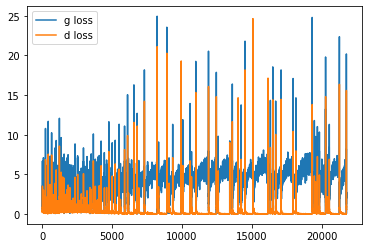

it: 21974; g_loss: 4.537893295288086; d_loss: 0.045333147048950195; avg_real_score: 0.9644955396652222; avg_fake_score: 0.02072511613368988: : 398it [00:19, 21.27it/s]

generated images


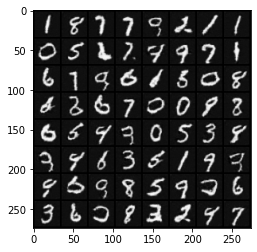

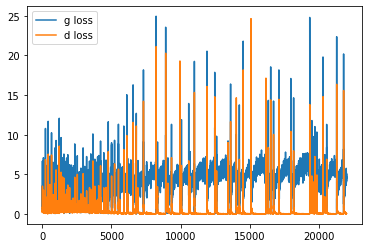

it: 22042; g_loss: 4.583268165588379; d_loss: 0.02674393355846405; avg_real_score: 0.9843542575836182; avg_fake_score: 0.016548393294215202: : 469it [00:23, 20.28it/s]
it: 22043; g_loss: 5.048107147216797; d_loss: 0.02121073752641678; avg_real_score: 0.9907652735710144; avg_fake_score: 0.012813704088330269: : 0it [00:00, ?it/s]

generated images


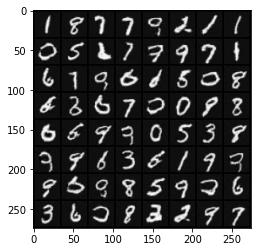

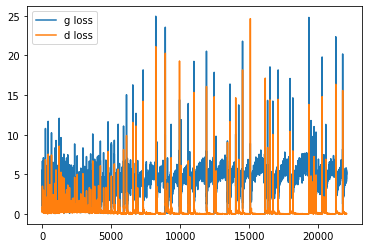

it: 22243; g_loss: 6.354605674743652; d_loss: 0.006394409574568272; avg_real_score: 0.9971041679382324; avg_fake_score: 0.0030291040893644094: : 198it [00:09, 22.11it/s]

generated images


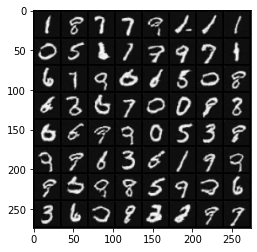

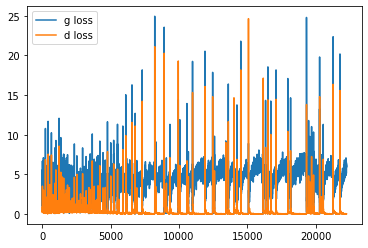

it: 22443; g_loss: 6.436978816986084; d_loss: 0.006643427070230246; avg_real_score: 0.9964361786842346; avg_fake_score: 0.0031285728327929974: : 400it [00:19, 21.57it/s]

generated images


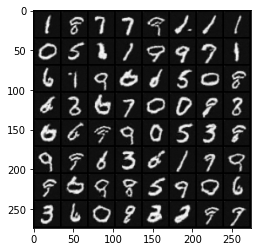

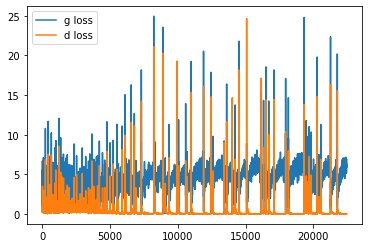

it: 22511; g_loss: 2.5923004150390625; d_loss: 0.9942269921302795; avg_real_score: 0.962836742401123; avg_fake_score: 0.14446108043193817: : 469it [00:22, 20.49it/s]
it: 22512; g_loss: 3.364753007888794; d_loss: 0.5014647841453552; avg_real_score: 0.8240448236465454; avg_fake_score: 0.0766860693693161: : 0it [00:00, ?it/s]

generated images


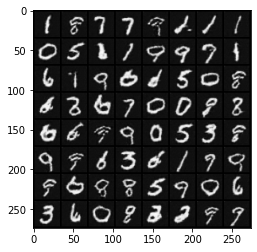

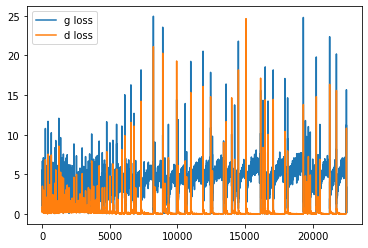

it: 22712; g_loss: 3.126960277557373; d_loss: 0.17461541295051575; avg_real_score: 0.8841550350189209; avg_fake_score: 0.06822376698255539: : 198it [00:09, 22.25it/s]

generated images


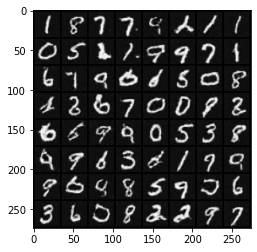

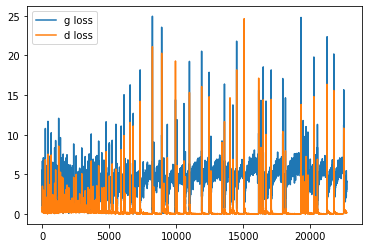

it: 22912; g_loss: 4.01024055480957; d_loss: 0.1140126883983612; avg_real_score: 0.9119210243225098; avg_fake_score: 0.03594642132520676: : 399it [00:19, 22.69it/s]   

generated images


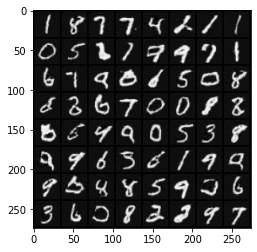

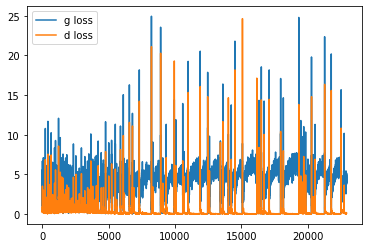

it: 22980; g_loss: 4.758542060852051; d_loss: 0.04579944163560867; avg_real_score: 0.9837654829025269; avg_fake_score: 0.018329184502363205: : 469it [00:23, 20.28it/s]
it: 22981; g_loss: 5.095427989959717; d_loss: 0.0342051200568676; avg_real_score: 0.9850624203681946; avg_fake_score: 0.01275409385561943: : 0it [00:00, ?it/s]

generated images


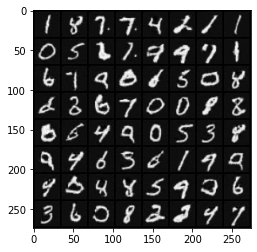

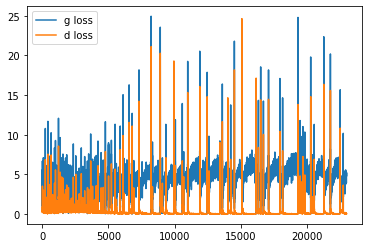

it: 23181; g_loss: 4.852315902709961; d_loss: 0.03017561137676239; avg_real_score: 0.9926813840866089; avg_fake_score: 0.013837920501828194: : 199it [00:09, 22.48it/s]

generated images


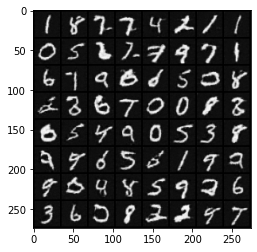

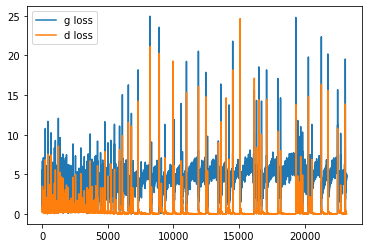

it: 23381; g_loss: 3.4934418201446533; d_loss: 0.16646087169647217; avg_real_score: 0.9467958211898804; avg_fake_score: 0.051624003797769547: : 399it [00:19, 22.26it/s]

generated images


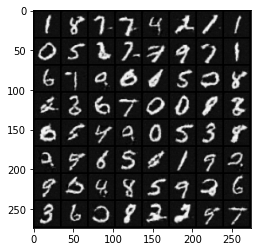

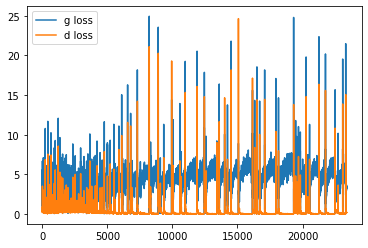

it: 23449; g_loss: 5.273584365844727; d_loss: 0.027651701122522354; avg_real_score: 0.9898020029067993; avg_fake_score: 0.00963654275983572: : 469it [00:23, 20.38it/s]


In [ ]:
nb_epochs = 50

g_losses = []
d_losses = []


j = 0


z_test = sample_z(64, nz) # we generate the noise only once for testing

for epoch in range(nb_epochs):
    
    # train
    pbar = tqdm(enumerate(dataloader))
    for i, batch in pbar:
        real_im, _ = batch # we don't care about the label for unconditional generation
        real_im = real_im.to(device)
        cur_batch_size = real_im.shape[0]  
        
        
        # 1. sample a z vector 
        z = sample_z(real_im.shape[0], nz)
        # 2. Generate a fake image
        fake_im = netG(z)
        # 3. Classify real image with D
        real_out = netD(real_im)
        # 4. Classify fake image with D
        fake_out = netD(fake_im.detach())

        
        ###
        ### Discriminator
        ###
        
        d_loss = criterion(real_out, torch.ones_like(real_out)) + criterion(fake_out, torch.zeros_like(fake_out))#     YOUR CODE HERE
        d_opt.zero_grad()
        d_loss.backward(retain_graph=True) # we need to retain graph=True to be able to calculate the gradient in the g backprop
        d_opt.step()

        
        ###
        ### Generator
        ###
      
        fake_out = netD(fake_im)
        
        g_loss = criterion(fake_out, torch.ones_like(fake_out))#      YOUR CODE HERE
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()
        
        
        # Save Metrics
        
        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())
        
        avg_real_score = real_out.mean().item()
        avg_fake_score = fake_out.mean().item()



        pbar.set_description(f"it: {j}; g_loss: {g_loss}; d_loss: {d_loss}; avg_real_score: {avg_real_score}; avg_fake_score: {avg_fake_score}")
        if i % display_freq == 0:

            fake_im = netG(z_test)
            
            un_norm = renorm(fake_im) # for visualization
            
            grid = torchvision.utils.make_grid(un_norm, nrow=8)
            pil_grid = to_pil(grid)  
            
            print("generated images")
            plt.imshow(pil_grid)
            plt.show()
            
            plt.plot(range(len(g_losses)), g_losses, label='g loss')
            plt.plot(range(len(g_losses)), d_losses, label='d loss')
            
            plt.legend()
            plt.show()
            
        j += 1

# 4. Conditional GANs [BONUS]

A simple way to improve training performance and obtain control of the generation is to provide extra information into the Generator and the Discriminator, known as **Conditional GANs**. In this case, we will provide the class label (digit number of MNIST) into both the generator and the discriminator. This will help both of the networks.

## 4.1 Conditional Generator and Discriminator

Complete the ConditionalDiscriminator and ConditionalGenerator classes using your GAN building blocks (`get_upsampling_block` and `get_downsampling_block` functions).


### 4.1.1 Generator

In [ ]:
# GENERATOR

'''
The conditional generator needs the label information as well as the latent vector. We will combine the latent vector and the class information in the following way:

- The class information for the generator will be represented as a one-hot vector sized `[batch_size, 10]` (since there are 10 classes in MNIST)
- The latent vector for the generator will still be sized `[batch_size, nz]`

1. Transform both of these modalities into 'images' (by adding dimensions)
2. Like before, apply the first upscaling block to both of these 'images'. We will now have 2 separate blocks sized 

'''

class ConditionalGenerator(nn.Module):
    def __init__(self, nz, nc, ngf, nchannels=1):
        super().__init__()
        
        self.upscaling_z = get_upscaling_block(nz, ngf*8, 4, 1, 0)
        self.upscaling_c = get_upscaling_block(nc, ngf*8, 4, 1, 0)
        
        ###################
        #                 #
        # YOUR CODE HERE  #
        #                 #
        self.rest_model = 
        
        ###################
        
    def forward(self, x, y):
        x = x.unsqueeze(2).unsqueeze(2)
        y = y.unsqueeze(2).unsqueeze(2)
        
        ###################
        #                 #
        # YOUR CODE HERE  #
        #                 #
        ###################
        
        return self.rest_model(x)

### 4.1.2 Discriminator

In [ ]:
# Discriminator

'''
The conditional discriminator needs the label information as well as the latent vector. We will combine the latent vector and the class information in the following way:

- The class information for the discriminator will be represented as a one-hot vector sized `[batch_size, 10]` (since there are 10 classes in MNIST)
- The latent vector for the generator will still be sized `[batch_size, nz]`

1. Transform both of these modalities into 'images' (by adding dimensions)
2. Like before, apply the first upscaling block to both of these 'images'. We will now have 2 separate blocks sized 

'''
    
class ConditionalDiscriminator(nn.Module):
    def __init__(self, ndf, nc, nchannels=1):
        super().__init__()
        self.downscale_x = get_downscaling_block(nchannels, ndf*2, 4, 2, 1, use_batch_norm=False)
        self.downscale_y = get_downscaling_block(nc, ndf*2, 4, 2, 1, use_batch_norm=False)
        
        ###################
        #                 #
        # YOUR CODE HERE  #
        
        self.rest = 
        
        #                 #
        ###################
        
    def forward(self, x, y):
        ###################
        #                 #
        # YOUR CODE HERE  #
        #                 #
        ###################
        
        return self.rest(x).squeeze(1).squeeze(1) # remove spatial dimensions

### 4.1.3 Sanity Checks

In [ ]:
# CONDITIONAL GENERATOR SANITY CHECKING

z = torch.randn(batch_size, nz)
y = F.one_hot(real_labels).float()

cG = ConditionalGenerator(nz=nz, ngf=16, nc=10)
x_fake = cG(z, y)
plt.imshow(transforms.ToPILImage()(make_grid(x_fake, nrow=8)))

In [ ]:
# Conditional Discriminator Sanity Checking

cD = ConditionalDiscriminator(ndf=32, nc=10, nchannels=1)
assert cD(real_batch, F.one_hot(real_labels).float()).shape == (real_batch.shape[0], 1)

## 4.2 Training

In [ ]:
nz = 100
ndf = 32
ngf = 32
nchannels= 1 
lr_d = 0.0002
lr_g = 0.0005
beta1= 0.5
display_freq = 200

nc= 10

netD = ConditionalDiscriminator(ndf, nc, nchannels=1).to(device)
netG = ConditionalGenerator(nz, nc, ngf).to(device)
        
netG.apply(weights_init)
netD.apply(weights_init)

g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))



In [ ]:
nb_epochs = 5

g_losses = []
d_losses = []

j = 0

z_test = sample_z(100, nz)  # we generate the noise only once for testing


for epoch in range(nb_epochs):
    
    pbar = tqdm(enumerate(dataloader))
    for i, batch in pbar:
        im, labels = batch 
        im = im.to(device)
        
        
        y = F.one_hot(labels).float().to(device)
        
        cur_batch_size = im.shape[0]  
        
        
        ###################
        #                 #
        # YOUR CODE HERE  #
        #                 #
        ###################
        
        # 1. sample a z vector 
        
        # 2. Generate a fake image
       
        # 3. Classify real image with D

        # 4. Classify fake image with D
        
        
        ###
        ### Discriminator
        ###
        
        d_loss = # YOUR CODE HERE
        d_opt.zero_grad()
        d_loss.backward(retain_graph=True) # we need to retain graph=True to be able to calculate the gradient in the g backprop
        d_opt.step()
        
        
        ###
        ### Generator
        ###
        

        g_loss = # YOUR CODE HERE
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()
        
        
        # Save Metrics
        
        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())
        
        avg_real_score = yhat_real.mean().item()
        avg_fake_score = yhat_fake.mean().item()

        pbar.set_description(f"it: {j}; g_loss: {g_loss}; d_loss: {d_loss}; avg_real_score: {avg_real_score}; avg_fake_score: {avg_fake_score}")
        
        if i % display_freq == 0:
            labels = torch.arange(0, 10).expand(size=(10, 10)).flatten().to(device)
            y = F.one_hot(labels).float().to(device)
            fake_im = netG(z_test, y)
            
            un_norm = renorm(fake_im) # for visualization
            
            grid = torchvision.utils.make_grid(un_norm, nrow=10)
            pil_grid = to_pil(grid)  
            
            plt.imshow(pil_grid)
            plt.show()
            
            
            plt.plot(range(len(g_losses)), g_losses, label='g loss')
            plt.plot(range(len(g_losses)), d_losses, label='d loss')
            
            plt.legend()
            plt.show()
            
        j += 1
            

## 4.2 Testing
Visualization of the impact of z on generation. All digits in the same column have the same noise vector z.

In [ ]:
n_ex = 15
n_classes = 10

z = sample_z(n_ex, nz).repeat(n_classes, 1) #.expand(10, nz)

netG.eval()

labels = torch.arange(n_classes).unsqueeze(0).reshape(-1, 1).repeat(1, n_ex).flatten().to(device)

ys = F.one_hot(labels).float()
fake_ims = netG(z, ys)

un_norm= renorm(fake_ims) # for visualization
grid = torchvision.utils.make_grid(un_norm, nrow=n_ex)
pil_grid = to_pil(grid)  

plt.imshow(pil_grid)
plt.show()
